In [3]:
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
import json
from typing import List, Dict, Tuple, Any
import itertools as itt
import os

In [4]:
import sys
sys.path.insert(0, '/opt/project')
import plots.utils as plutils

In [5]:
a = np.array([0.1, 0.])
b = np.array([0., 1.])

In [6]:
a = np.random.randn(5)

In [7]:
a

array([-1.10870752,  1.98956195, -1.06774149, -1.10255292,  0.84518015])

In [8]:
a.any()

True

In [9]:
True < -1

False

In [10]:
np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))

ValueError: shapes (5,) and (2,) not aligned: 5 (dim 0) != 2 (dim 0)

In [ ]:
np.linalg.norm(a)

In [11]:
IX = pd.IndexSlice

In [12]:
COLORS = ['#fb8072','#80b1d3', '#fdb462','#bebada','#8dd3c7','#ffed6f']
MARKERS = ['s', 'o', 'v', '^', 'x', '*']
plt.rc('axes', labelsize=8)

<BarContainer object of 6 artists>

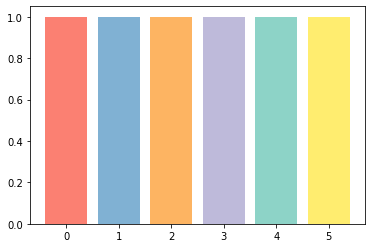

In [13]:
h = np.ones(len(COLORS))
plt.bar(np.arange(len(COLORS)), h, color=COLORS)

In [1805]:
dirs = os.listdir('/opt/project/data/k8s-json')
random = np.random.RandomState(seed=1)
lengths = []
for i in random.randint(0, len(dirs), 10000):
    f = dirs[i]
    if f.endswith('json'):
        with open(os.path.join('/opt/project/data/k8s-json', f), 'r') as fh:
            d = json.load(fh)
            lengths.append(len(d['frames']))

In [1806]:
pd.Series(lengths).describe()

count    10000.000000
mean       290.845700
std        752.583957
min          1.000000
25%         54.000000
50%        103.000000
75%        269.000000
max      27000.000000
dtype: float64

In [1807]:
np.percentile(lengths, 10)

30.0

In [1820]:
dirs = os.listdir('/opt/project/data/k8s-json')
random = np.random.RandomState(seed=1)
lengths = []
fractions = []
for i in random.randint(0, len(dirs), 10000):
    f = dirs[i]
    if f.endswith('json'):
        with open(os.path.join('/opt/project/data/k8s-json', f), 'r') as fh:
            d = json.load(fh)
        num_frames = len(d['frames'][:30])
        count = 0
        last_record_id = -1
        for frame in d['frames'][:30]:
            for record in frame['tls_records']:
                if record['record_number'] == last_record_id:
                    continue
                else:
                    last_record_id = record['record_number']
                    count += 1
        lengths.append(count)
        fractions.append(count / num_frames)
        # print(f"{fractions[-1]:3.2f} times more records than frames: {len(d['frames']):4d} vs. {lengths[-1]} - {f}")

In [1821]:
pd.Series(lengths).describe()

count    10000.000000
mean        28.966200
std          6.993679
min          1.000000
25%         24.000000
50%         32.000000
75%         34.000000
max         77.000000
dtype: float64

In [1822]:
pd.Series(fractions).describe()

count    10000.000000
mean         1.000078
std          0.221167
min          0.433333
25%          0.866667
50%          1.100000
75%          1.133333
max          2.566667
dtype: float64

In [1823]:
1/0.433


2.3094688221709005

In [76]:
def get_knn_result_dirs(exp_folder: str):
    knn_trials = []
    for td in os.listdir(exp_folder):
        trial_dir = os.path.join(exp_folder, td)
        if os.path.isdir(trial_dir):
            if os.path.exists(os.path.join(trial_dir, 'conf-mats.json')):
                knn_trials.append(trial_dir)
    return knn_trials

In [77]:
def get_overview_df(exp_folder: str) -> pd.DataFrame:
    """
    Construct a dataframe with the configurations, result and path of the trials.
    The column `trial_dir` returns the path to the folder in which the result
    files of the trial from the configuration of that row are stored. Results to
    a specific configuration can thus be obtained by selecting a configuration
    and then load the required results with the `trial_dir`.

    Args:
        exp_folder: Folder that contains the trials of a run (cryptic folder
            names in the form of a 128 bit uuid).

    Returns:
        dataframe with configuration, log prob and trial dir for each completed trial.
    """
    configs = []
    for f in os.listdir(exp_folder):
        trial_dir = os.path.join(exp_folder, f)
        if not os.path.isdir(trial_dir):
            continue
        config_path = os.path.join(trial_dir, 'config.json')
        if not os.path.exists(config_path):
            continue
        with open(config_path, 'r') as fh:
            config = json.load(fh)
        short_config = {
            "uuid_": config['uuid_'],
            "classifier": config['classifier'],
            "accuracy": config['accuracy'],
            "seq_element_type": config['seq_element_type'],
            "binning_method": config['binning_method'],
            "num_bins": config['num_bins'],
            "day_train_start": config['day_train_start'],
            "day_train_end": config['day_train_end'],
            "seq_length": config['seq_length'],
            "seed": config['seed'],
            "trial_dir": config['trial_dir'],
            "is_finished": True
        }
        if short_config['accuracy'] is None:
            sequence = load_series(short_config['trial_dir'])
            short_config['is_finished'] = False
            if sequence is None:
                pass
            else:
                short_config['accuracy'] = np.mean(np.concatenate(
                    [list(get_accuracy(s).values()) for s in sequence]
                ))
        configs.append(short_config)
    return pd.DataFrame(configs)

In [78]:
def get_accuracy(conf_mat: Dict[str, Dict[str, float]], labels=None) -> Dict[str, float]:
    assert type(conf_mat) == dict, 'conf_mat is not dict: ' + str(conf_mat)
    accuracies = {}
    for expected, results in conf_mat.items():
        if labels is not None:
            if expected not in labels:
                continue
        accuracies[expected] = 0.
        total = 0.
        for actual, number in results.items():
            total += number
            if expected == actual:
                accuracies[expected] = number
        accuracies[expected] /= total
    return accuracies


def get_precision(conf_mat: Dict[str, Dict[str, float]], labels=None) -> Dict[str, float]:
    tps = {}
    fps = {}
    for lbl, results in conf_mat.items():
        if labels is not None:
            if lbl not in labels:
                continue
        if lbl not in tps: tps[lbl] = 0
        if lbl not in fps: fps[lbl] = 0
        for actual, number in results.items():
            if actual not in tps: tps[actual] = 0
            if actual not in fps: fps[actual] = 0
            if actual == lbl:
                tps[actual] += number
            else:
                fps[actual] += number
    precision = {}
    for k in tps.keys():
        if tps[k] + fps[k] == 0:
            precision[k] = 0.
        else:
            precision[k] = tps[k] / (tps[k] + fps[k])
    return precision


def get_recall(conf_mat: Dict[str, Dict[str, float]], labels=None) -> Dict[str, float]:
    recall = {}
    for lbl, results in conf_mat.items():
        if labels is not None:
            if lbl not in labels:
                continue
        if lbl in results:
            recall[lbl] = results[lbl] / np.sum(list(results.values()))
        else:
            recall[lbl] = 0
    return recall


def get_accuracy_open(conf_mat: Dict[str, Dict[str, float]], closed: List[str]) -> Dict[str, float]:
    assert type(conf_mat) == dict, 'conf_mat is not dict: ' + str(conf_mat)
    accuracies = {}
    totals = {}
    for expected, results in conf_mat.items():
        if expected in closed:
            expected_ = expected
        else:
            expected_ = 'unknown'
        if expected_ not in accuracies: accuracies[expected_] = 0.
        if expected_ not in totals: totals[expected_] = 0.
        for actual, number in results.items():
            totals[expected_] += number
            if expected_ == actual:
                accuracies[expected_] = number
    for lbl in accuracies.keys():
        accuracies[lbl] /= totals[lbl]
    return accuracies


def get_precision_open(conf_mat: Dict[str, Dict[str, float]], closed: List[str]) -> Dict[str, float]:
    tps = {}
    fps = {}
    for lbl, results in conf_mat.items():
        if lbl in closed:
            expected_ = lbl
        else:
            expected_ = 'unknown'
        if expected_ not in tps: tps[lbl] = 0
        if expected_ not in fps: fps[lbl] = 0
        for actual, number in results.items():
            if actual not in tps: tps[actual] = 0
            if actual not in fps: fps[actual] = 0
            if actual == expected_:
                tps[expected_] += number
            else:
                fps[expected_] += number
    precision = {}
    for k in tps.keys():
        if tps[k] + fps[k] == 0:
            precision[k] = 0.
        else:
            precision[k] = tps[k] / (tps[k] + fps[k])
    return precision


def get_recall_open(conf_mat: Dict[str, Dict[str, float]], closed: List[str]) -> Dict[str, float]:
    recall = {'unknown': 0}
    relevant_unknown = 0
    retrieved_unknown = 0
    for lbl, results in conf_mat.items():
        if lbl in closed:
            if lbl in results:
                recall[lbl] = results[lbl] / np.sum(list(results.values()))
            else:
                recall[lbl] = 0
        else:
            expected_ = 'unknown'
            if 'unknown' in results:
                retrieved_unknown += results['unknown']
                relevant_unknown += np.sum(list(results.values()))
    if retrieved_unknown == relevant_unknown == 0:
        recall['unknown'] = 0
    elif retrieved_unknown > 0 and relevant_unknown == 0:
        raise ValueError(f"retrieved unknown is {retrieved_unknown} and relevant unknown is zero.")
    else:
        recall['unknown'] = retrieved_unknown / relevant_unknown    
    return recall

In [79]:
#def load_series(bins: str, classifier: str, element: str, trained_on: int) -> List[Dict[str, Dict[str, float]]]:
#    p = f'/opt/project/classification-results-{classifier}-{element}-{bins}-30-{trained_on}.json'
#    if not os.path.exists(p):
#        return None
#    with open(p, 'r') as fh:
#        data = json.load(fh)
#    return data
def load_series(trial_dir: str) -> List[Dict[str, Dict[str, float]]]:
    p = os.path.join(trial_dir, 'conf-mats.json')
    if not os.path.exists(p):
        return None
    with open(p, 'r') as fh:
        data = json.load(fh)
    return data

In [80]:
def get_accuracy_def(trial_dir: str) -> pd.DataFrame:
    """
    Compute the accuracy for a KNN experiment, i.e., compute that from the
    exported confusion matrices.
    """
    sequence = load_series(trial_dir)
    tmp = []
    for s in sequence:
        if type(s) == dict:
            tmp.append((get_accuracy(s)))
        else:
            print(f"s not a dict for tiral dir {trial_dir}")
    df = pd.DataFrame.from_dict(tmp)
    return df


def get_precision_df(trial_dir: str) -> pd.DataFrame:
    """
    Compute the precision for a KNN experiment, i.e., compute that from the
    exported confusion matrices.
    """
    sequence = load_series(trial_dir)
    tmp = []
    for s in sequence:
        tmp.append((get_precision(s)))
    df = pd.DataFrame.from_dict(tmp)
    return df


def get_recall_df(trial_dir: str) -> pd.DataFrame:
    """
    Compute the recall for a KNN experiment, i.e., compute that from the
    exported confusion matrices.
    """
    sequence = load_series(trial_dir)
    tmp = []
    for s in sequence:
        tmp.append((get_recall(s)))
    df = pd.DataFrame.from_dict(tmp)
    return df

In [81]:
df = get_overview_df('/opt/project/data/classification-results')

In [82]:
df.sort_values(by='accuracy')

,uuid_,classifier,accuracy,seq_element_type,binning_method,num_bins,day_train_start,day_train_end,seq_length,seed,trial_dir,is_finished
35,4f6ec43929bf47519e9b39edba5dfd65_0,phmm,0.000000,frame,one-bin,1,0,30,30,1,/opt/project/data/classification-results/4f6ec...,True
12,0388c4f742eb418895603070804c6d44_0,phmm,0.000000,frame,one-bin,1,0,30,30,1,/opt/project/data/classification-results/0388c...,True
16,65dd70188edd426ca8143f453ba9f7b0_0,phmm,0.000000,frame,one-bin,1,0,30,30,1,/opt/project/data/classification-results/65dd7...,False
5,ee88b097ee104a63ba1cb5ba16196ae2_0,phmm,0.246314,record,one-bin,1,0,30,30,1,/opt/project/data/classification-results/ee88b...,True
29,48cf9f6483e740de905d59f1e5ba4bf4_0,phmm,0.286942,record,one-bin,1,0,30,30,1,/opt/project/data/classification-results/48cf9...,True
32,380ea664fbfa44c1b92f4488f88f2c97_0,phmm,0.288278,record,one-bin,1,0,30,30,1,/opt/project/data/classification-results/380ea...,True
9,fbbe229e392b421fbef33a21a0fba86a_0,phmm,0.308771,record,one-bin,1,0,30,30,1,/opt/project/data/classification-results/fbbe2...,True
7,af0bd7085c9f4d7cb4dd32dfb861057d_0,phmm,0.322934,record,one-bin,1,0,30,30,1,/opt/project/data/classification-results/af0bd...,True
28,6e8f2e79c91c4785a45f38251468b366_0,phmm,0.447160,frame,one-bin,1,0,30,30,1,/opt/project/data/classification-results/6e8f2...,True
8,49c68b12a7b64267a330de19438ff1ab_0,phmm,0.456599,frame,one-bin,1,0,30,30,1,/opt/project/data/classification-results/49c68...,True


In [83]:
trial_dir = '/opt/project/data/classification-results/09f5c766738249e78a2ffd467c5a726f_0'
td_knn_frame = '/opt/project/data/classification-results/c0c4380aa5bd41f9b0c74b274180fbba_0'
td_knn_record = '/opt/project/data/classification-results/2ba52dcccbff4d1481b81135384b039f_0'
td_mc_frame = '/opt/project/data/classification-results/d42c4fb67a1145afa0d0efcdd91ae6fc_0'
td_mc_record = '/opt/project/data/classification-results/199cbe0f63fe446097d9669a5984f922_0'
td_phmm_frame = '/opt/project/data/classification-results/4b27caebae3b4311a26d470a69cf8953_0'
td_phmm_record = '/opt/project/data/classification-results/09f5c766738249e78a2ffd467c5a726f_0'

In [84]:
sequence = load_series(trial_dir)
accuracies = []
for s in sequence:
    accuracies.append(pd.Series(np.array(list(get_accuracy(s).values()))).dropna().mean())
accuracies = pd.Series(accuracies).dropna()
# accuracies = [np.mean(list(get_accuracy(s).values())) for s in sequence]

Text(0, 0.5, 'Accuracy')

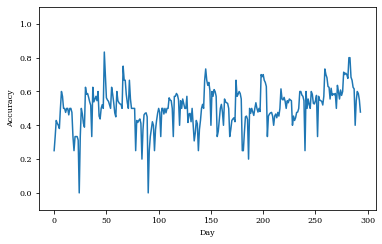

In [80]:
accuracies = []
prefix = 'amazon.'
for s in sequence:
    nominator = 0
    denominator = 0
    for true_lbl, matrix in s.items():
        # if not true_lbl.startswith(prefix):
        if not true_lbl.find(prefix) > -1:
            continue
        for pred_lbl, num in matrix.items():
            # if pred_lbl.startswith(prefix):
            if not pred_lbl.find(prefix) > -1:
                nominator += 1
            denominator += 1
        accuracies.append(nominator / denominator)
fig, ax = plutils.get_fig(1.75)
ax.plot(accuracies)
ax.set_ylim(-0.1, 1.1)
ax.set_xlabel("Day")
ax.set_ylabel("Accuracy")

In [81]:
[f"{d['classifier']}|{d['seq_type']}" for d in accuracy_dfs]

['KNN|record',
 'KNN|frame',
 'MC|record',
 'MC|frame',
 'PHMM|record',
 'PHMM|frame']

In [92]:
df = pd.concat([accuracy_dfs[i]['data'].mean() for i in range(len(accuracy_dfs))], axis=1)
df.columns = [f"{d['classifier']}|{d['seq_type']}" for d in accuracy_dfs]


In [93]:
df.sort_index(inplace=True)

In [95]:
df.shape[0]

98

In [94]:
texcode = "\\toprule\nWeb-Site & KNN-R & KNN-F & MC-R & MC-F & PHMM-R & PHMM-F"
texcode += "\\\\\n\\midrule\n"
for i in range(df.shape[0]):
    row = f"{df.index.values[i]:30s} & "
    for j in range(df.shape[1]):
        row += f'{df.iloc[i, j]*100:3.2f} & '
    row = row[:-2] + " \\\\\n"
    texcode += row
texcode += "\n\\bottomrule"
print(texcode)

\toprule
Web-Site & KNN-R & KNN-F & MC-R & MC-F & PHMM-R & PHMM-F\\
\midrule
bitly.com                      & 99.89 & 98.49 & 100.00 & 99.89 & 99.95 & 93.73  \\
blogger.com                    & 99.90 & 99.90 & 100.00 & 100.00 & 100.00 & 99.86  \\
chaturbate.com                 & 76.18 & 82.30 & 84.02 & 88.83 & 79.33 & 82.83  \\
chouftv.ma                     & 45.46 & 73.23 & 70.59 & 86.38 & 75.86 & 87.29  \\
daftsex.com                    & 85.03 & 80.77 & 84.33 & 83.11 & 77.60 & 79.86  \\
discord.com                    & 68.91 & 71.11 & 72.01 & 78.33 & 60.29 & 70.90  \\
e-hentai.org                   & 87.65 & 96.19 & 92.44 & 96.80 & 82.28 & 85.71  \\
envato.com                     & 54.36 & 17.00 & 83.06 & 62.69 & 53.96 & 46.41  \\
evernote.com                   & 100.00 & 99.15 & 100.00 & 98.83 & 97.37 & 87.74  \\
google.com                     & 99.49 & 99.66 & 98.38 & 99.91 & 99.74 & 99.04  \\
gyazo.com                      & 100.00 & 98.61 & 100.00 & 98.14 & 88.90 & 90.28  \\
me

In [79]:
accuracy_dfs = [
    {'seq_type': 'record', 'classifier': 'KNN', 'data': get_accuracy_def(td_knn_record)},
    {'seq_type': 'frame', 'classifier': 'KNN', 'data': get_accuracy_def(td_knn_frame)},
    {'seq_type': 'record', 'classifier': 'MC', 'data': get_accuracy_def(td_mc_record)},
    {'seq_type': 'frame', 'classifier': 'MC', 'data': get_accuracy_def(td_mc_frame)},
    {'seq_type': 'record', 'classifier': 'PHMM', 'data': get_accuracy_def(td_phmm_record)},
    {'seq_type': 'frame', 'classifier': 'PHMM', 'data': get_accuracy_def(td_phmm_frame)},
]

In [37]:
list(range(0,6,2)), np.arange(1, 7, 2), np.arange(0, 6, 2)

([0, 2, 4], array([1, 3, 5]), array([0, 2, 4]))

In [100]:
y= [pd.Series(accuracy_dfs[i]['data'].values.flatten()).dropna() for i in range(0, 6, 2)]

In [105]:
y[0]

0       0.916667
1       0.200000
2       0.090909
3       0.416667
4       0.150000
          ...   
4895    1.000000
4896    1.000000
4897    1.000000
4898    1.000000
4899    1.000000
Length: 4746, dtype: float64

In [50]:
import matplotlib

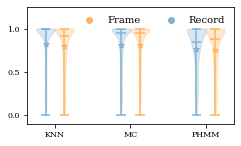

In [103]:
fig, ax = plutils.get_fig(1)
matplotlib.rcParams.update({'font.size': 10})
x = np.arange(0, 6, 2)
y= [pd.Series(accuracy_dfs[i]['data'].values.flatten()).dropna() for i in range(0, 6, 2)]
parts = ax.violinplot(
    y,
    positions=x,
    showmeans=False,
    showmedians=True
)
for partname in ('cbars','cmins','cmaxes', 'cmedians'):
    vp = parts[partname].set_edgecolor(COLORS[-2])
for pc in parts['bodies']:
    pc.set_color(COLORS[-2])
ax.scatter(x, [np.mean(t) for t in y], marker='*', c=COLORS[-2])
    
x = np.arange(0.5, 5, 2)
y= [pd.Series(accuracy_dfs[i]['data'].values.flatten()).dropna() for i in range(1, 6, 2)]
parts = ax.violinplot(
    y,
    positions=x,
    showmeans=False,
    showmedians=True
)
for partname in ('cbars','cmins','cmaxes','cmedians'):
    vp = parts[partname].set_edgecolor(COLORS[-1])
for pc in parts['bodies']:
    pc.set_color(COLORS[-1])
ax.scatter(x, [np.mean(t) for t in y], marker='*', c=COLORS[-1])

ax.scatter([0], [3], label='Frame', c=COLORS[-1])
ax.scatter([0], [3], label='Record', c=COLORS[-2])
ax.set_xticks([0.25, 2.25, 4.25])
ax.set_ylim(-0.1, 1.25)
ax.set_xticklabels(['KNN', 'MC', 'PHMM'])
ax.legend(frameon=False, ncol=2)
plt.tight_layout()
plt.savefig('/opt/project/img/violin-accuracies.pdf')

In [24]:
plt.violinplot?

In [23]:
accuracy_dfs[0]['data']

,www.ebay.com,www.ebay.de,www.ebay.co.uk,www.ebay.com.au,www.ebay.fr,www.ebay.ca,www.ebay.it,chaturbate.com,www.udemy.com,xhamster.com,...,www.instagram.com,www.imdb.com,wetransfer.com,soundcloud.com,spotify.com,blogger.com,softonic.com,google.com,www.youtube.com,www.facebook.com
0,0.916667,0.250000,0.181818,0.208333,0.100000,0.250000,0.150,0.954545,1.000000,0.181818,...,1.0,1.0,1.0,1.000000,0.95,0.95,1.0,1.000000,NaN,NaN
1,0.916667,0.050000,0.136364,0.250000,0.050000,0.150000,0.100,0.954545,1.000000,0.090909,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,1.000000,NaN,NaN
2,0.916667,0.400000,0.181818,0.260870,0.050000,0.050000,0.250,0.954545,1.000000,0.136364,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,1.000000,NaN,NaN
3,0.916667,0.350000,0.227273,0.291667,0.100000,0.150000,0.200,0.909091,1.000000,0.136364,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,1.000000,NaN,NaN
4,0.916667,0.200000,0.090909,0.208333,0.050000,0.250000,0.250,0.954545,1.000000,0.090909,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,0.956522,NaN,NaN
5,0.916667,0.200000,0.363636,0.291667,0.150000,0.250000,0.400,0.954545,1.000000,0.090909,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,0.958333,NaN,NaN
6,0.916667,0.300000,0.272727,0.333333,0.050000,0.250000,0.050,1.000000,1.000000,0.136364,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,1.000000,NaN,NaN
7,0.916667,0.200000,0.136364,0.250000,0.200000,0.350000,0.250,0.863636,1.000000,0.090909,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,1.000000,NaN,NaN
8,0.913043,0.050000,0.090909,0.083333,0.105263,0.050000,0.350,1.000000,1.000000,0.045455,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,1.000000,NaN,NaN
9,0.916667,0.300000,0.136364,0.375000,0.150000,0.200000,0.250,0.772727,1.000000,0.045455,...,1.0,1.0,1.0,1.000000,1.00,1.00,1.0,1.000000,NaN,NaN


In [ ]:
fig, ax = plutils.get_fig(1)
for idx, item in enumerate(accuracy_dfs):
    accuracies = []
    for i in range(item['data'].shape[0]):
        accuracies.append(item['data'].iloc[i, :].dropna().mean())
    s = pd.Series(accuracies).dropna()
    ax.plot(s.index.values, s.values, label=f"{item['classifier']}-{item['seq_type']}", c=COLORS[idx])
ax.legend(ncol=2, frameon=False)
ax.set_xlabel("Day")
ax.set_ylabel("Accuracy")
ax.set_ylim(-0.1, 1.1)
plt.tight_layout()
plt.savefig("avg-accuracy-over-time.pdf")

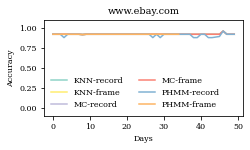

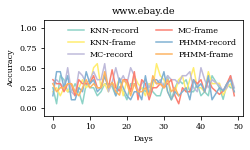

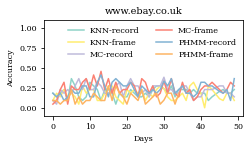

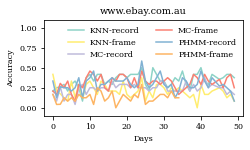

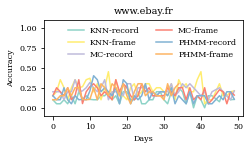

...

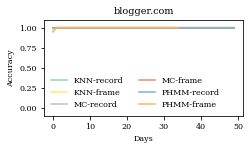

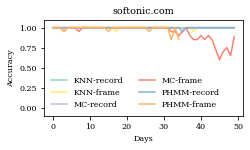

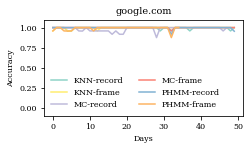

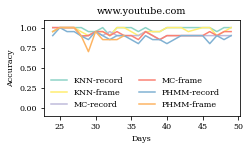

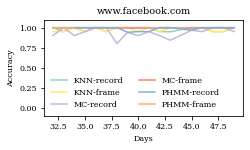

In [72]:
for lbl in accuracy_dfs[0]['data'].columns:
    fig, ax = plutils.get_fig(ncols=1)
    for i, item in enumerate(accuracy_dfs):
        ax.plot(item['data'].loc[:, lbl].dropna(), label=f"{item['classifier']}-{item['seq_type']}", c=COLORS[i])
    ax.legend(ncol=2, frameon=False)
    ax.set_ylim(-0.1, 1.1)
    ax.set_xlabel("Days")
    ax.set_ylabel("Accuracy")
    ax.set_title(lbl)
    plt.tight_layout()
    plt.savefig(f'{lbl}.pdf', format='pdf')
    plt.show()

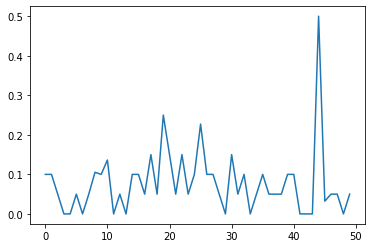

In [10]:
sequence = load_series(trial_dir)
accuracies = [np.min(np.concatenate([np.array([0.5]), list(get_accuracy(s).values())])) for s in sequence]
plt.plot(accuracies)

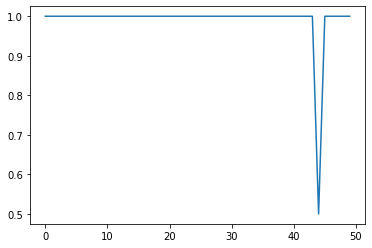

In [11]:
sequence = load_series(trial_dir)
accuracies = [np.max(np.concatenate([np.array([0.5]), list(get_accuracy(s).values())])) for s in sequence]
plt.plot(accuracies)

In [12]:
classifiers = ['mc', 'knn']
bins = ['no-bins', 'single-bin']
elements = ['frame', 'record']
trained_ons = [1, 2, 3, 4, 5, 6, 7, 8, 9]
records = []
for c, b, e, t in itt.product(classifiers, bins, elements, trained_ons):
    series = load_series(b, c, e, t)
    if series is None:
        continue
    for d, result in enumerate(series):
        acc = pd.Series(get_accuracy(result)).mean()
        records.append({
            'classifier': c,
            'bins': b,
            'elements': e,
            'trained_on': t,
            'accuracy': acc,
            'day': d
        })
overview = pd.DataFrame(records).set_index(['classifier', 'bins', 'elements', 'trained_on'])

TypeError: load_series() takes 1 positional argument but 4 were given

In [13]:
overview

NameError: name 'overview' is not defined

In [72]:
s =  f"Accuracy MC:  {overview.loc[IX['mc']].accuracy.mean() * 100}{os.linesep}"
s += f"Accuracy KNN: {overview.loc[IX['knn']].accuracy.mean() * 100}"
print(s)

Accuracy MC:  51.69377592889265
Accuracy KNN: 56.713738842260085


In [73]:
s =  f"Accuracy Frame:  {overview.loc[IX[:, :, 'frame', :]].accuracy.mean() * 100}{os.linesep}"
s += f"Accuracy Record: {overview.loc[IX[:, :, 'record', :]].accuracy.mean() * 100}"
print(s)

Accuracy Frame:  59.658624000351445
Accuracy Record: 48.74889077080128


In [74]:
grouped = overview.loc[:, 'accuracy'].reset_index().groupby(['classifier', 'bins', 'elements', 'trained_on']).mean().sort_values(by='accuracy')

In [75]:
for (c, b, e, t), row in grouped.iterrows():
    print(f"{c}\t{b}\t{e}\t{t}\t{row.accuracy * 100}")

mc	single-bin	record	1	14.983489879068385
mc	single-bin	record	2	15.900786349761484
mc	single-bin	record	3	15.914919656861601
mc	single-bin	record	4	16.026801680835394
mc	single-bin	record	5	16.64519590638316
mc	single-bin	record	6	16.970921964019713
mc	single-bin	record	7	17.571074551802052
mc	single-bin	record	8	17.82828624893932
mc	single-bin	record	9	18.33709847670587
knn	single-bin	record	1	27.76174058486302
knn	single-bin	record	2	29.02658170985763
knn	single-bin	record	4	30.280065776534176
knn	single-bin	record	3	30.43502845735985
knn	single-bin	record	6	31.498377093867568
knn	single-bin	record	5	31.714734078445318
knn	single-bin	record	8	32.908084361210435
knn	single-bin	record	7	32.99979393157228
knn	single-bin	record	9	33.186740560817256
mc	single-bin	frame	1	33.226786217877006
mc	single-bin	frame	2	33.96824660447738
mc	single-bin	frame	3	34.24080839107178
mc	single-bin	frame	4	34.57642522103755
mc	single-bin	frame	5	34.75670922633068
mc	single-bin	frame	6	34.82137767346966
m

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:889: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)
/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:889: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


(0.0, 1.0)

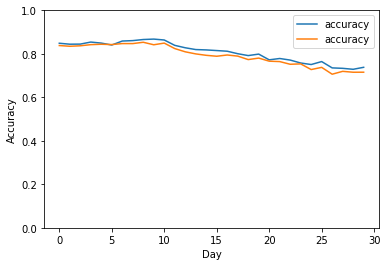

In [76]:
ax = plt.subplot()
overview.loc[IX['mc', 'no-bins', 'frame', 9], :].reset_index(drop=True).plot(x='day', y='accuracy', ax=ax)
overview.loc[IX['mc', 'no-bins', 'record', 9], :].reset_index(drop=True).plot(x='day', y='accuracy', ax=ax)
ax.set_xlabel("Day")
ax.set_ylabel("Accuracy")
ax.set_ylim(0, 1)

In [78]:
import sys
sys.path.insert(0, '/opt/project')
import implementation.data_conversion.dataprep as dprep

In [79]:
flow_jsons = list(os.listdir('/k8s-json'))

In [80]:
len(flow_jsons)

493261

In [87]:
flow_jsons[0]

'spankbang_chromium_gatherer-01-v5hlz_88225955.json'

In [88]:
with open('/k8s-json/spankbang_chromium_gatherer-01-v5hlz_88225955.json', 'r') as fh:
    d = json.load(fh)

In [100]:
main_flows = []
skipped = 0
for i in np.random.randint(0, 493261, size=10000):
    main_flow = dprep.load_flow_dict(f"{flow_jsons[i]}")
    if main_flow is None:
        skipped += 1
        continue
    main_flow = dprep.make_main_flows([main_flow])[flow_jsons[i][:-5]]
    main_flows.append(main_flow)

In [101]:
frame_lengths = []
for flow in main_flows:
    for frame in flow.frames[:30]:
        frame_lengths.append(frame.tcp_length)

In [114]:
x = np.sort(np.unique(frame_lengths))

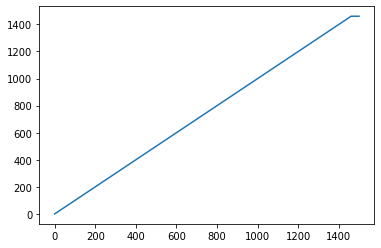

In [120]:
y = np.zeros(1500)
y[x] = 1
# plt.plot(x, np.cumsum(np.arange(1, x.size + 1)))
plt.plot(np.arange(1500), np.cumsum(y))

# Select closed world labels

In [79]:
import json
import os
import pandas as pd
import numpy as np

In [80]:
with open('/opt/project/data/cache/labels.json', 'r') as fh:
    labels = json.load(fh)

In [81]:
with open('/opt/project/data/cache/meta_data.json', 'r') as fh:
    metadata = json.load(fh)

In [82]:
unique_labels = []
for _, data in metadata:
    for flow in data:
        try:
            lbl = labels[f"{flow['url_id']}"]
            if lbl not in unique_labels:
                unique_labels.append(lbl)
        except:
            continue

In [7]:
metadata[0][1]

[{'meta_data_id': 9691,
  'filename': 'ebay_chromium_gatherer-01-58rvz_19572014',
  'url': 'https://www.ebay.com/b/Mens-Clothing/1059/bn_696958',
  'url_id': 1},
 {'meta_data_id': 14735,
  'filename': 'ebay_firefox_gatherer-01-xm2ks_24658288',
  'url': 'https://www.ebay.com/b/Mens-Clothing/1059/bn_696958',
  'url_id': 1},
 {'meta_data_id': 9690,
  'filename': 'ebay_chromium_gatherer-01-v5hlz_37766710',
  'url': 'https://www.ebay.com/b/Computers-Tablets-Network-Hardware/58058/bn_1865247',
  'url_id': 2},
 {'meta_data_id': 14738,
  'filename': 'ebay_firefox_gatherer-01-8xbk9_51845885',
  'url': 'https://www.ebay.com/b/Computers-Tablets-Network-Hardware/58058/bn_1865247',
  'url_id': 2},
 {'meta_data_id': 9693,
  'filename': 'ebay_chromium_gatherer-01-8xbk9_15424104',
  'url': 'https://www.ebay.com/b/Antiques/20081/bn_1851017',
  'url_id': 3},
 {'meta_data_id': 14742,
  'filename': 'ebay_firefox_gatherer-01-nn6x6_29679010',
  'url': 'https://www.ebay.com/b/Antiques/20081/bn_1851017',
  'u

In [83]:
count = {i: {lbl: 0 for lbl in unique_labels} for i in range(72)}
flat_count = {lbl: 0 for lbl in unique_labels}
for day, (_, data) in enumerate(metadata):
    for flow in data:
        if os.path.exists(f'/opt/project/data/k8s-json/{flow["filename"]}.json'):
            try:
                count[day][labels[f"{flow['url_id']}"]] += 1
                flat_count[labels[f"{flow['url_id']}"]] += 1
            except:
                continue

In [35]:
count

{0: {'www.ebay.com': 98,
  'www.ebay.com.au': 102,
  'www.ebay.de': 100,
  'www.ebay.co.uk': 100,
  'www.ebay.fr': 100,
  'www.ebay.ca': 100,
  'www.ebay.it': 100,
  'chaturbate.com': 98,
  'www.inquirer.net': 110,
  'www.udemy.com': 100,
  'xhamster.com': 100,
  'www.ilovepdf.com': 99,
  'www.youm7.com': 100,
  'www.mediafire.com': 98,
  'envato.com': 100,
  'www.metropoles.com': 106,
  'chouftv.ma': 96,
  'www.worldometers.info': 100,
  'zerodha.com': 98,
  'www.trendyol.com': 100,
  'discord.com': 95,
  'www.tahiamasr.com': 96,
  'medium.com': 100,
  'www.y2mate.com': 77,
  'www.ladbible.com': 100,
  'namu.wiki': 100,
  'thepiratebay.org': 109,
  'spankbang.com': 100,
  'sxyprn.com': 100,
  'daftsex.com': 100,
  'e-hentai.org': 100,
  'txxx.com': 100,
  'www.mundosexanuncio.com': 100,
  'viralporn.com': 102,
  'www.amazon.com': 100,
  'zoom.us': 101,
  'www.netflix.com': 116,
  'www.instagram.com': 104,
  'www.amazon.in': 100,
  'www.amazon.co.jp': 99,
  'www.instructure.com': 99,
 

In [42]:
s = pd.Series(flat_count).sort_values()

In [55]:
num_open = int((s.shape[0] - 3) * 0.5)
num_open

49

In [63]:
open_world_pages_ = [
    'www.pikiran-rakyat.com',
    'www.sporx.com',
    'www.facebook.com',
    'www.youtube.com',
    'www.cint.com',
    'www.y2mate.com',
    'www.mlb.com',
    'www.netflix.com',
]

In [64]:
random = np.random.RandomState(seed=1)
open_world_pages = [s for s in open_world_pages_]
closed_world_pages = []
while len(open_world_pages) < 49:
    idx = random.randint(3, s.shape[0])
    lbl = s.index.values[idx]
    if lbl not in open_world_pages:
        open_world_pages.append(lbl)
    else:
        continue
for lbl in s.index.values[3:]:
    if lbl not in open_world_pages:
        closed_world_pages.append(lbl)

In [65]:
closed_world_pages

['www.nih.gov',
 'chaturbate.com',
 'chouftv.ma',
 'www.shutterstock.com',
 'www.tahiamasr.com',
 'www.grammarly.com',
 'spankbang.com',
 'www.brilio.net',
 'medium.com',
 'www.youm7.com',
 'www.healthline.com',
 'www.elbalad.news',
 'www.cnet.com',
 'www.imdb.com',
 'www.ladbible.com',
 'www.ebay-kleinanzeigen.de',
 'www.bola.net',
 'www.amazon.com',
 'www.worldometers.info',
 'txxx.com',
 'www.amazon.in',
 'www.amazon.co.jp',
 'namu.wiki',
 'www.vidio.com',
 'daftsex.com',
 'www.okta.com',
 'www.kompas.com',
 'www.flashscore.com',
 'www.espn.com',
 'www.theepochtimes.com',
 'www.trendyol.com',
 'xhamster.com',
 'www.ebay.co.uk',
 'www.ebay.ca',
 'www.uber.com',
 'zoom.us',
 'www.ebay.com.au',
 'namnak.com',
 'www.instagram.com',
 'softonic.com',
 'www.metropoles.com',
 'www.inquirer.net',
 'www.google.com.hk',
 'www.google.es',
 'www.google.com.br',
 'www.google.fr',
 'www.google.ru',
 'www.google.de',
 'www.primevideo.com']

In [62]:
open_world_pages

['www.pikiran-rakyat.com',
 'www.sporx.com',
 'www.facebook.com',
 'www.youtube.com',
 'www.cint.com',
 'www.y2mate.com',
 'www.mlb.com',
 'www.ebay.de',
 'www.zendesk.com',
 'blogger.com',
 'www.bukalapak.com',
 'viralporn.com',
 'spotify.com',
 'www.ebay.it',
 'www.amazon.ca',
 'www.sciencedirect.com',
 'www.shopify.com',
 'discord.com',
 'sxyprn.com',
 'www.tradingview.com',
 'zerodha.com',
 'soundcloud.com',
 'www.ebay.com',
 'google.com',
 'envato.com',
 'www.amazon.co.uk',
 'www.ilovepdf.com',
 'thepiratebay.org',
 'www.google.com',
 'www.netflix.com',
 'www.google.co.jp',
 'www.setn.com',
 'www.amazon.de',
 'www.ebay.fr',
 'www.jotform.com',
 'smallpdf.com',
 'e-hentai.org',
 'www.jagran.com',
 'wetransfer.com',
 'www.mediafire.com',
 'www.google.co.in',
 'bitly.com',
 'evernote.com',
 'www.udemy.com',
 'www.instructure.com',
 'www.merdeka.com',
 'www.grid.id',
 'www.mundosexanuncio.com',
 'gyazo.com']

In [50]:
for i in range(s.shape[0]):
    print(f'{s.index.values[i]:30s}', f'{s.iloc[i]:4d}')

www.vitalsource.com               0
www.breitbart.com                 0
www.liputan6.com                  0
www.pikiran-rakyat.com          718
www.sporx.com                  3297
www.facebook.com               3936
www.youtube.com                4886
www.cint.com                   5152
www.y2mate.com                 5601
www.mlb.com                    6766
www.amazon.de                  6895
www.mediafire.com              6899
www.bukalapak.com              6904
www.nih.gov                    6938
www.ebay.com                   6950
www.zendesk.com                6979
www.setn.com                   7028
www.amazon.co.uk               7040
chaturbate.com                 7043
www.amazon.ca                  7043
chouftv.ma                     7048
zerodha.com                    7066
www.shutterstock.com           7076
www.tradingview.com            7106
www.instructure.com            7107
smallpdf.com                   7107
www.tahiamasr.com              7108
www.grid.id                 

In [66]:
len(os.listdir('/opt/project/data/grid-search-results/'))

478060

In [67]:
478060 * 3.6

1721016.0

# Analze Grid Search

In [20]:
def load_results(exp_dir: str) -> pd.DataFrame:
    configs = []
    folders = os.listdir(exp_dir)
    for i, trial_dir in enumerate(folders):
        cfg_path = os.path.join(exp_dir, trial_dir, 'config.json')
        if os.path.exists(cfg_path):
            with open(cfg_path, 'r') as fh:
                cfg = json.load(fh)
            if 'tp' in cfg and cfg['tp'] is not None:
                cfg['accuracy'] = (cfg['tp'] + cfg['tn']) / (cfg['tp'] + cfg['tn'] + cfg['fp'] + cfg['fn'])
                if cfg['tp'] == 0 and cfg['fn'] == 0:
                    cfg['recall'] = None
                else:
                    cfg['recall'] = cfg['tp'] / (cfg['tp'] + cfg['fn'])
                if cfg['tp'] == 0 and cfg['fp'] == 0:
                    cfg['precision'] = None
                else:
                    cfg['precision'] = cfg['tp'] / (cfg['tp'] + cfg['fp'])
                cfg['tnr'] = cfg['tn'] / (cfg['tn'] + cfg['fp'])
                if cfg['tp'] == 0 and cfg['fp'] == 0 and cfg['fn'] == 0:
                    cfg['f1'] = None
                else:
                    cfg['f1'] = 2 * cfg['tp'] / (2 * cfg['tp'] + cfg['fp'] + cfg['fn'])
                configs.append(cfg)
            else:
                pass
        else:
            pass
    print(f"Evaluated {len(folders)} Folders")
    return configs

In [21]:
tmp = load_results('/opt/project/data/grid-search-results/')

Evaluated 497471 Folders


In [22]:
len(tmp)

196494

In [23]:
df = pd.DataFrame.from_dict(tmp)
df = df.loc[df.tp > 0]

In [24]:
df.classifier.unique()

array(['phmm', 'mc'], dtype=object)

In [25]:
df.head()

,uuid_,accuracy,trial_dir,classifier,binning_method,num_bins,day_train_start,day_train_end,seq_length,seq_element_type,...,recall,precision,tnr,f1,knn_fraction,min_nll_train,min_nll_val,max_nll_train,max_nll_val,nlls
4,c140643392a442beb88ba153fcea4ef4,0.935076,/opt/project/data/grid-search-results/c1406433...,phmm,geometric,60.0,0,30,10,record,...,1.000000,0.261992,0.933544,0.415204,NaN,NaN,NaN,NaN,NaN,NaN
7,b4984569f5e04139bbca5aa2b72bbdaa,1.000000,/opt/project/data/grid-search-results/b4984569...,phmm,geometric,20.0,0,30,5,frame,...,1.000000,1.000000,1.000000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN
8,28027bda3eee49189f302314e4f9b71e,0.964736,/opt/project/data/grid-search-results/28027bda...,phmm,None,NaN,0,30,5,frame,...,1.000000,0.375981,0.963970,0.546492,NaN,NaN,NaN,NaN,NaN,NaN
9,6522b222e7504f70bae48a9dbee509bf,0.860597,/opt/project/data/grid-search-results/6522b222...,phmm,equal_width,30.0,0,30,15,frame,...,0.999367,0.132195,0.857584,0.233503,NaN,NaN,NaN,NaN,NaN,NaN
10,5b584d697986491680426edd2d48b048,0.995283,/opt/project/data/grid-search-results/5b584d69...,phmm,geometric,180.0,0,30,5,record,...,1.000000,0.802920,0.995190,0.890688,NaN,NaN,NaN,NaN,NaN,NaN


In [2004]:
df.columns

Index(['uuid_', 'accuracy', 'trial_dir', 'classifier', 'binning_method',
       'num_bins', 'day_train_start', 'day_train_end', 'seq_length',
       'seq_element_type', 'hmm_length', 'hmm_duration', 'knn_num_neighbors',
       'seed', 'hmm_init_prior', 'hmm_num_iter', 'ano_density_estimator',
       'bin_edges', 'max_bin_size', 'label', 'sum_log_prob_train',
       'sum_log_prob_val', 'avg_log_prob_train', 'avg_log_prob_val', 'tp',
       'tn', 'fn', 'fp', 'recall', 'precision', 'tnr', 'f1', 'knn_fraction',
       'min_nll_train', 'min_nll_val', 'max_nll_train', 'max_nll_val', 'nlls'],
      dtype='object')

In [2000]:
df.set_index(['classifier', 'binning_method']).sort_index().loc['phm']

uuid_  accuracy  \
classifier binning_method                                               
mc         equal_width     4cfc52b258e84c96bc86ff127ba7cd74  0.993092   
           equal_width     bc3b7aa5dd494e2b9c80180a2111637e  0.693146   
           equal_width     eb730af60b3d47519959b56375d86141  0.997877   
           equal_width     33b68fbbdc3c4fd09a7521f5d062a980  0.841970   
           equal_width     00691f941f7a4efab0f549d3bbf3d187  0.999906   
...                                                     ...       ...   
phmm       NaN             2ef1e1fee6d14d07b1d1ab8a5d6a2fc5  1.000000   
           NaN             56bf0a90dffe4604a667c361423c6761  0.977516   
           NaN             f39f698de65a4e74a68ca8e1031889b6  0.920884   
           NaN             2b094bdfc98843798e7202cc2c86f727  0.998925   
           NaN             75fe7cc6681940debdd5c91a92de2a43  1.000000   

                                                                   trial_dir  \
classifier binning_method                                                      
mc         equal_width     /opt/project/data/grid-search-results/4cfc52b2...   
           equal_width     /opt/project/data/grid-search-results/bc3b7aa5...   
           equal_width     /opt/project/data/grid-search-results/eb730af6...   
           equal_width     /opt/project/data/grid-search-results/33b68fbb...   
           equal_width     /opt/project/data/grid-search-results/00691f94...   
...                                                                      ...   
phmm       NaN             /opt/project/data/grid-search-results/2ef1e1fe...   
           NaN             /opt/project/data/grid-search-results/56bf0a90...   
           NaN             /opt/project/data/grid-search-results/f39f698d...   
           NaN             /opt/project/data/grid-search-results/2b094bdf...   
           NaN             /opt/project/data/grid-search-results/75fe7cc6...   

                           num_bins  day_train_start  day_train_end  \
classifier binning_method                                             
mc         equal_width        100.0                0             30   
           equal_width         10.0                0             30   
           equal_width         10.0                0             30   
           equal_width         30.0                0             30   
           equal_width         80.0                0             30   
...                             ...              ...            ...   
phmm       NaN                  NaN                0             30   
           NaN                  NaN                0             30   
           NaN                  NaN                0             30   
           NaN                  NaN                0             30   
           NaN                  NaN                0             30   

                           seq_length seq_element_type  hmm_length  \
classifier binning_method                                            
mc         equal_width             15            frame         NaN   
           equal_width             30           record         NaN   
           equal_width             30            frame         NaN   
           equal_width              5            frame         NaN   
           equal_width             25            frame         NaN   
...                               ...              ...         ...   
phmm       NaN                      5            frame        20.0   
           NaN                     10            frame         5.0   
           NaN                      5            frame        30.0   
           NaN                     10           record         5.0   
           NaN                     10           record        15.0   

                           hmm_duration  ...    recall  precision       tnr  \
classifier binning_method                ...                                  
mc         equal_width              NaN  ...  0.760596   1.000000  1.0

In [2007]:
df.set_index(['classifier', 'binning_method', 'num_bins'])\
    .sort_index()\
    .loc[pd.IndexSlice['phmm', 'equal_width', 40], ['precision', 'recall', 'label']]\
    .sort_values('precision', ascending=False)\
    .groupby('label').max()

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:889: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


,precision,recall
label,,
chaturbate.com,1.000000,1.000000
chouftv.ma,0.103550,1.000000
daftsex.com,0.133627,1.000000
medium.com,0.111449,1.000000
namnak.com,0.780554,1.000000
namu.wiki,0.137555,1.000000
softonic.com,1.000000,1.000000
spankbang.com,0.230993,1.000000
txxx.com,0.347385,1.000000


<AxesSubplot:xlabel='label'>

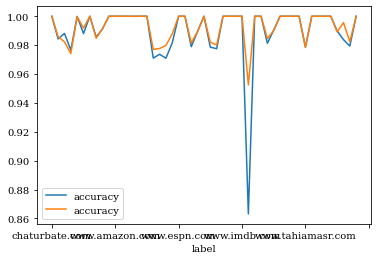

In [670]:
ax = plt.subplot()
df.loc[df.classifier=='phmm', ['label', 'accuracy']].groupby('label').max().plot(ax=ax)
df.loc[df.classifier=='mc', ['label', 'accuracy']].groupby('label').max().plot(ax=ax)

In [671]:
df.loc[:, ['label', 'accuracy', 'tnr', 'recall', 'f1', 'precision', 'tp', 'tn', 'fp', 'fn']].groupby('label').max().sort_values(by="accuracy")

,accuracy,tnr,recall,f1,precision,tp,tn,fp,fn
label,,,,,,,,,
www.inquirer.net,0.952439,0.967490,1.0,0.251431,0.180021,1694,70352,71441,1333
medium.com,0.976549,0.990230,1.0,0.475755,0.387420,1430,72267,56902,1397
www.ebay.ca,0.977073,0.994313,1.0,0.474119,0.423645,1438,72557,10166,1291
www.ebay.co.uk,0.977664,0.996416,1.0,0.525363,0.410835,1583,72566,10021,1401
www.tahiamasr.com,0.978592,0.994835,1.0,0.481256,0.393276,1423,72610,56909,1222
www.ebay.com.au,0.979761,0.997427,1.0,0.649081,0.658537,1727,72496,10080,1494
www.google.fr,0.980110,0.999178,1.0,0.577985,0.464485,1426,72924,56827,1420
www.google.com.br,0.981521,0.998054,1.0,0.524569,0.544538,1428,72840,56880,1424
www.google.es,0.982005,0.998808,1.0,0.602786,0.551564,1428,72895,53265,1424


<AxesSubplot:>

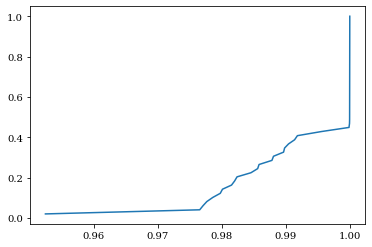

In [672]:
np.cumsum(df.loc[:, ['label', 'accuracy']].groupby('label').max().sort_values(by="accuracy").accuracy.value_counts(normalize=True).sort_index()).plot()

In [673]:
df_bak = df

In [1258]:
df.num_bins.unique()

array([ 60.,  20.,  nan,  30., 180., 160.,  80., 100.,  70., 120.,  90.,
        40.,  50.,  10., 190.,   1., 140., 200., 130., 170., 110., 150.])

In [31]:
num_groups = 0
sum_prec = 0
sum_rec = 0
sum_acc = 0
rows = []
chosen_classifier = 'phmm'
if chosen_classifier == 'phmm':
    cols = ['binning_method', 'num_bins', 'seq_length', 'hmm_duration',
            'seq_element_type', 'accuracy', 'precision', 'recall', 'trial_dir']
else:
    cols = ['binning_method', 'num_bins', 'seq_length',
            'seq_element_type', 'accuracy', 'precision', 'recall', 'trial_dir']
# for (lbl, seq_length), group in df.loc[df.classifier == chosen_classifier].groupby(['label', 'seq_length']):
for lbl, group in df.loc[df.classifier == chosen_classifier].groupby('label'):
    num_groups += 1
    group.loc[np.isnan(group.num_bins.values), 'num_bins'] = 1500
    group = group.sort_values(
        by=['precision', 'recall', 'seq_length', 'num_bins'],
        ascending=[False, False, True, True]
    )
    sum_rec += group.iloc[0]['recall']
    sum_prec += group.iloc[0]['precision']
    sum_acc += group.iloc[0]['accuracy']
    idx = group.recall.argmax()
    d = group.iloc[0, :].loc[cols].to_dict()
    d['label'] = lbl
    # d['seq_length'] = seq_length
    rows.append(d)
    print(
        lbl, 
        #seq_length, 
        '\n', 
        group.iloc[0][['binning_method', 'num_bins', 'seq_length', 'hmm_duration',
                       'seq_element_type', 'accuracy', 'precision', 'recall', 'fp',
                       'avg_log_prob_train', 'avg_log_prob_val']])
    print()
print(sum_prec / num_groups, sum_rec / num_groups, sum_acc / num_groups)

chaturbate.com 
 binning_method        equal_width
num_bins                     40.0
seq_length                      5
hmm_duration                  5.0
seq_element_type            frame
accuracy                      1.0
precision                     1.0
recall                        1.0
fp                              0
avg_log_prob_train      -2.256721
avg_log_prob_val        -2.252416
Name: 60553, dtype: object

chouftv.ma 
 binning_method             None
num_bins                 1500.0
seq_length                   10
hmm_duration               15.0
seq_element_type          frame
accuracy               0.984303
precision              0.641115
recall                 0.391212
fp                          309
avg_log_prob_train   -10.393497
avg_log_prob_val     -25.357094
Name: 43034, dtype: object

daftsex.com 
 binning_method             None
num_bins                 1500.0
seq_length                   10
hmm_duration                5.0
seq_element_type         record
accuracy      

www.inquirer.net 
 binning_method            None
num_bins                1500.0
seq_length                   5
hmm_duration              20.0
seq_element_type         frame
accuracy              0.863164
precision              0.14258
recall                 0.99941
fp                       10181
avg_log_prob_train   -5.438523
avg_log_prob_val     -4.590814
Name: 55395, dtype: object

www.instagram.com 
 binning_method        singlebin
num_bins                    1.0
seq_length                    5
hmm_duration                5.0
seq_element_type          frame
accuracy                    1.0
precision                   1.0
recall                      1.0
fp                            0
avg_log_prob_train    -2.382484
avg_log_prob_val      -2.382838
Name: 1806, dtype: object

www.kompas.com 
 binning_method            None
num_bins                1500.0
seq_length                   5
hmm_duration              30.0
seq_element_type        record
accuracy                   1.0
precision 

In [ ]:
num_params = []
for _, row in pd.DataFrame(rows).iterrows():
    with open(os.path.join(row['trial_dir'], 'model.json'), 'r') as fh:
        tmp = json.load(fh)
        #break
        count = 0
        for v in tmp['p_o_in_i'].values():
            if v > 1e-9:
                count += 1
        x = len(tmp['p_ij']) + count
        print(f"{row['label']:25s}: {len(tmp['p_ij']):4d} + {count:4d} = {x:4d}")
        num_params.append(x)

In [2712]:
np.max(num_params)

4649

In [1911]:
num_params = []
for _, row in pd.DataFrame(rows).iterrows():
    with open(os.path.join(row['trial_dir'], 'model.json'), 'r') as fh:
        tmp = len(json.load(fh)['edges'])
        print(row['label'], tmp)
        num_params.append(tmp)

chaturbate.com 10
chouftv.ma 7322
daftsex.com 8715
medium.com 9567
namnak.com 160
namu.wiki 564
softonic.com 5
spankbang.com 896
txxx.com 4334
www.amazon.co.jp 24
www.amazon.com 24
www.amazon.in 30
www.bola.net 7
www.brilio.net 19
www.cnet.com 18
www.ebay-kleinanzeigen.de 6
www.ebay.ca 11882
www.ebay.co.uk 3698
www.ebay.com.au 2706
www.elbalad.news 3358
www.espn.com 10
www.flashscore.com 13
www.google.com.br 1461
www.google.com.hk 286
www.google.de 35
www.google.es 5723
www.google.fr 5593
www.google.ru 32
www.grammarly.com 5
www.healthline.com 13
www.imdb.com 9
www.inquirer.net 1106
www.instagram.com 8
www.kompas.com 17
www.ladbible.com 883
www.metropoles.com 475
www.nih.gov 5
www.okta.com 13
www.primevideo.com 40
www.shutterstock.com 13
www.tahiamasr.com 11078
www.theepochtimes.com 5
www.trendyol.com 9
www.uber.com 6
www.vidio.com 8
www.worldometers.info 4520
www.youm7.com 1022
xhamster.com 7080
zoom.us 7


In [1913]:
import numpy as np

In [1915]:
np.max(num_params)

11882

In [33]:
np.sum(pd.DataFrame(rows).accuracy.values > 0.9), pd.DataFrame(rows).shape[0]

(48, 49)

In [2592]:
pd.DataFrame(rows)

,binning_method,num_bins,seq_length,hmm_duration,seq_element_type,accuracy,precision,recall,trial_dir,label
0,equal_width,40.0,5,5.0,frame,1.000000,1.000000,1.000000,/opt/project/data/grid-search-results/072e258a...,chaturbate.com
1,None,1500.0,10,15.0,frame,0.984303,0.641115,0.391212,/opt/project/data/grid-search-results/711b5764...,chouftv.ma
2,None,1500.0,10,5.0,record,0.988080,0.838049,0.543671,/opt/project/data/grid-search-results/93a0167a...,daftsex.com
3,None,1500.0,10,5.0,record,0.976549,0.387420,0.379021,/opt/project/data/grid-search-results/4d233d12...,medium.com
4,equal_width,80.0,10,10.0,frame,0.999879,1.000000,0.993741,/opt/project/data/grid-search-results/9473fa55...,namnak.com
5,None,1500.0,10,5.0,record,0.988026,0.683421,0.974853,/opt/project/data/grid-search-results/a03a3e9c...,namu.wiki
6,equal_width,10.0,5,5.0,record,1.000000,1.000000,1.000000,/opt/project/data/grid-search-results/6c97ce6e...,softonic.com
7,None,1500.0,10,5.0,frame,0.985607,0.596196,0.769825,/opt/project/data/grid-search-results/beeb8627...,spankbang.com
8,equal_width,100.0,30,30.0,frame,0.991278,0.709910,0.996837,/opt/project/data/grid-search-results/7fa4d9e1...,txxx.com
9,equal_width,30.0,5,5.0,frame,1.000000,1.000000,1.000000,/opt/project/data/grid-search-results/ff2ae732...,www.amazon.co.jp


In [2738]:
import subprocess

In [2746]:
subprocess.check_output(cmd, shell=True)

b'/opt/project/data/grid-search-results/072e258ac4594aa7b2b249394b09ee49_0/\n/opt/project/data/grid-search-results/072e258ac4594aa7b2b249394b09ee49_0/config.json\n/opt/project/data/grid-search-results/072e258ac4594aa7b2b249394b09ee49_0/model.json\n/opt/project/data/grid-search-results/711b5764e85c487d9c51d7181c917ced_0/\n/opt/project/data/grid-search-results/711b5764e85c487d9c51d7181c917ced_0/config.json\n/opt/project/data/grid-search-results/711b5764e85c487d9c51d7181c917ced_0/model.json\n/opt/project/data/grid-search-results/93a0167a12a04c83be137bc6f9972631_0/\n/opt/project/data/grid-search-results/93a0167a12a04c83be137bc6f9972631_0/config.json\n/opt/project/data/grid-search-results/93a0167a12a04c83be137bc6f9972631_0/model.json\n/opt/project/data/grid-search-results/4d233d1254a347b2add37f1816eaa7fd_0/\n/opt/project/data/grid-search-results/4d233d1254a347b2add37f1816eaa7fd_0/config.json\n/opt/project/data/grid-search-results/4d233d1254a347b2add37f1816eaa7fd_0/model.json\n/opt/project/d

In [2745]:
cmd = "tar -czvf /opt/project/notebooks/exemplary-trial-dirs.tar.gz"
for td in pd.DataFrame(rows).trial_dir:
    cmd += f" {td}"
print(cmd)

tar -czvf /opt/project/notebooks/exemplary-trial-dirs.tar.gz /opt/project/data/grid-search-results/072e258ac4594aa7b2b249394b09ee49_0 /opt/project/data/grid-search-results/711b5764e85c487d9c51d7181c917ced_0 /opt/project/data/grid-search-results/93a0167a12a04c83be137bc6f9972631_0 /opt/project/data/grid-search-results/4d233d1254a347b2add37f1816eaa7fd_0 /opt/project/data/grid-search-results/9473fa5535644feba762f3ca5db56ebd_0 /opt/project/data/grid-search-results/a03a3e9c63b349a6b8b20636caa40fcc_0 /opt/project/data/grid-search-results/6c97ce6eff314b5fbb880834ff0ff449_0 /opt/project/data/grid-search-results/beeb86279118405db61d118f5bf2b79a_0 /opt/project/data/grid-search-results/7fa4d9e1c356465ea0d984caa2f3852c_0 /opt/project/data/grid-search-results/ff2ae7321299423785d9dca83b83ddc6_0 /opt/project/data/grid-search-results/2bb3c74186ce44f4959653234830c68f_0 /opt/project/data/grid-search-results/be48d6ab35b74cb0b94f26593f908877_0 /opt/project/data/grid-search-results/a3f8d0b2133e47a09b87c7570

In [2713]:
pd.DataFrame(rows).set_index('label').loc['namu.wiki', 'trial_dir']

'/opt/project/data/grid-search-results/a03a3e9c63b349a6b8b20636caa40fcc_0'

In [1339]:
texcode = "\\toprule\nBinning & nBins & nPackets & HMM Length & Element & ACC & Prec & Rec & web-site"
texcode += "\\\\\n\\midrule\n"
summary = pd.DataFrame(rows).sort_values(by='precision')
for i in range(summary.shape[0]):
    row = '' # f"{summary.index.values[i]:30s} & "
    for j in range(summary.shape[1]):
        if j == summary.shape[1] - 2:
            continue
        if type(summary.iloc[i, j]) in [np.float, np.float32, np.float64]:
            row += f'{summary.iloc[i, j]:.4f} & '
        elif type(summary.iloc[i, j]) == str:
            row += f'{summary.iloc[i, j].replace("_", "-")} & '
        else:
            row += f'{summary.iloc[i, j]} & '
    row = row[:-2] + " \\\\\n"
    texcode += row
texcode += "\n\\bottomrule"
print(texcode)

\toprule
Binning & nBins & nPackets & HMM Length & Element & ACC & Prec & Rec & web-site\\
\midrule
None & 1500.0000 & 5 & 20.0000 & frame & 0.8632 & 0.1426 & 0.9994 & www.inquirer.net  \\
None & 1500.0000 & 10 & 5.0000 & record & 0.9709 & 0.3056 & 0.3964 & www.ebay.ca  \\
None & 1500.0000 & 5 & 15.0000 & frame & 0.9637 & 0.3456 & 1.0000 & www.google.com.br  \\
None & 1500.0000 & 10 & 10.0000 & record & 0.9778 & 0.3595 & 0.2031 & www.tahiamasr.com  \\
None & 1500.0000 & 10 & 15.0000 & record & 0.9737 & 0.3607 & 0.3076 & www.ebay.co.uk  \\
None & 1500.0000 & 10 & 5.0000 & record & 0.9765 & 0.3874 & 0.3790 & medium.com  \\
None & 1500.0000 & 5 & 30.0000 & frame & 0.9721 & 0.4068 & 0.9979 & www.google.fr  \\
None & 1500.0000 & 5 & 30.0000 & frame & 0.9747 & 0.4314 & 1.0000 & www.google.es  \\
geometric & 90.0000 & 15 & 10.0000 & frame & 0.9710 & 0.4396 & 0.9143 & www.ebay.com.au  \\
None & 1500.0000 & 10 & 10.0000 & frame & 0.9794 & 0.5293 & 0.2625 & xhamster.com  \\
None & 1500.0000 & 10

<ipython-input-1339-3a925e865ea0>:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if type(summary.iloc[i, j]) in [np.float, np.float32, np.float64]:


In [1340]:
configs = {}
for _, row in pd.DataFrame(rows).iterrows():
    configs[row['label']] = row['trial_dir']
print(json.dumps(configs, indent=1))
with open(f'{chosen_classifier}-configs.json', 'w') as fh:
    json.dump(configs, fh)

{
 "chaturbate.com": "/opt/project/data/grid-search-results/072e258ac4594aa7b2b249394b09ee49_0",
 "chouftv.ma": "/opt/project/data/grid-search-results/711b5764e85c487d9c51d7181c917ced_0",
 "daftsex.com": "/opt/project/data/grid-search-results/93a0167a12a04c83be137bc6f9972631_0",
 "medium.com": "/opt/project/data/grid-search-results/4d233d1254a347b2add37f1816eaa7fd_0",
 "namnak.com": "/opt/project/data/grid-search-results/9473fa5535644feba762f3ca5db56ebd_0",
 "namu.wiki": "/opt/project/data/grid-search-results/a03a3e9c63b349a6b8b20636caa40fcc_0",
 "softonic.com": "/opt/project/data/grid-search-results/6c97ce6eff314b5fbb880834ff0ff449_0",
 "spankbang.com": "/opt/project/data/grid-search-results/beeb86279118405db61d118f5bf2b79a_0",
 "txxx.com": "/opt/project/data/grid-search-results/7fa4d9e1c356465ea0d984caa2f3852c_0",
 "www.amazon.co.jp": "/opt/project/data/grid-search-results/ff2ae7321299423785d9dca83b83ddc6_0",
 "www.amazon.com": "/opt/project/data/grid-search-results/2bb3c74186ce44f49

In [1341]:
with open("/opt/project/data/grid-search-results/cba2dd76a9ed4a17ae3e993ba2f19867_0/config.json", 'r') as fh:
    print(json.dumps(json.load(fh), indent=1))

{
 "uuid_": "cba2dd76a9ed4a17ae3e993ba2f19867",
 "accuracy": 1.0,
 "trial_dir": "/opt/project/data/grid-search-results/cba2dd76a9ed4a17ae3e993ba2f19867_0",
 "classifier": "mc",
 "binning_method": "equal_width",
 "num_bins": 10,
 "day_train_start": 0,
 "day_train_end": 30,
 "seq_length": 5,
 "seq_element_type": "frame",
 "hmm_length": null,
 "hmm_duration": null,
 "knn_num_neighbors": null,
 "seed": 1,
 "hmm_init_prior": null,
 "hmm_num_iter": null,
 "ano_density_estimator": null,
 "bin_edges": null,
 "max_bin_size": 1500,
 "label": "chaturbate.com",
 "fp": 0,
 "fn": 0,
 "tp": 1580,
 "tn": 72830,
 "sum_log_prob_train": -2713.8760571149023,
 "sum_log_prob_val": -1096.45006076872,
 "avg_log_prob_train": -0.6994525920399233,
 "avg_log_prob_val": -0.6939557346637468
}


In [1342]:
configs = {}
for _, row in pd.DataFrame(rows).iterrows():
    if row['seq_length'] not in configs:
        configs[row['seq_length']] = {}
    configs[int(row['seq_length'])][row['label']] = row['trial_dir']
print(json.dumps(configs, indent=1))
with open('mc-configs-by-seq-length.json', 'w') as fh:
    json.dump(configs, fh)
# {row['label']: row['trial_dir'] for _, row in pd.DataFrame(rows).iterrows()}

{
 "5": {
  "chaturbate.com": "/opt/project/data/grid-search-results/072e258ac4594aa7b2b249394b09ee49_0",
  "softonic.com": "/opt/project/data/grid-search-results/6c97ce6eff314b5fbb880834ff0ff449_0",
  "www.amazon.co.jp": "/opt/project/data/grid-search-results/ff2ae7321299423785d9dca83b83ddc6_0",
  "www.amazon.com": "/opt/project/data/grid-search-results/2bb3c74186ce44f4959653234830c68f_0",
  "www.amazon.in": "/opt/project/data/grid-search-results/be48d6ab35b74cb0b94f26593f908877_0",
  "www.bola.net": "/opt/project/data/grid-search-results/a3f8d0b2133e47a09b87c7570c6285c6_0",
  "www.brilio.net": "/opt/project/data/grid-search-results/34cb8033bda741aa8fe70f1cd4fa5bf6_0",
  "www.cnet.com": "/opt/project/data/grid-search-results/d4487c75d31e49ffabcb4e54a6e995d3_0",
  "www.ebay-kleinanzeigen.de": "/opt/project/data/grid-search-results/94a6616495d447c4a4799bbe473fb08c_0",
  "www.espn.com": "/opt/project/data/grid-search-results/18ab4506da364682ad9920b88b8129c2_0",
  "www.flashscore.com": "/

In [2167]:
pd.DataFrame(rows)

,binning_method,num_bins,seq_length,hmm_duration,seq_element_type,accuracy,precision,recall,trial_dir,label
0,equal_width,40.0,5,5.0,frame,1.000000,1.000000,1.000000,/opt/project/data/grid-search-results/072e258a...,chaturbate.com
1,None,1500.0,10,15.0,frame,0.984303,0.641115,0.391212,/opt/project/data/grid-search-results/711b5764...,chouftv.ma
2,None,1500.0,10,5.0,record,0.988080,0.838049,0.543671,/opt/project/data/grid-search-results/93a0167a...,daftsex.com
3,None,1500.0,10,5.0,record,0.976549,0.387420,0.379021,/opt/project/data/grid-search-results/4d233d12...,medium.com
4,equal_width,80.0,10,10.0,frame,0.999879,1.000000,0.993741,/opt/project/data/grid-search-results/9473fa55...,namnak.com
5,None,1500.0,10,5.0,record,0.988026,0.683421,0.974853,/opt/project/data/grid-search-results/a03a3e9c...,namu.wiki
6,equal_width,10.0,5,5.0,record,1.000000,1.000000,1.000000,/opt/project/data/grid-search-results/6c97ce6e...,softonic.com
7,None,1500.0,10,5.0,frame,0.985607,0.596196,0.769825,/opt/project/data/grid-search-results/beeb8627...,spankbang.com
8,equal_width,100.0,30,30.0,frame,0.991278,0.709910,0.996837,/opt/project/data/grid-search-results/7fa4d9e1...,txxx.com
9,equal_width,30.0,5,5.0,frame,1.000000,1.000000,1.000000,/opt/project/data/grid-search-results/ff2ae732...,www.amazon.co.jp


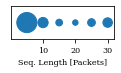

In [2296]:
tmp = pd.DataFrame(rows)
coordinates = {}
for _, row in tmp.iterrows():
    sl = row['seq_length']
    hd = row['hmm_duration'] if 'hmm_duration' in tmp.columns else 0
    if sl not in coordinates:
        coordinates[sl] = {}
    if hd not in coordinates[sl]:
        coordinates[sl][hd] = 0
    coordinates[sl][hd] += 1
    
fig, ax = plutils.get_fig(1/2)
xs = []
ys = []
ss = []
for x, vs in coordinates.items():
    for y, s in coordinates[x].items():
        xs.append(x)
        # ys.append(y)
        ys.append(0)
        ss.append(s * 15)
ax.scatter(xs, ys, s=ss)
ax.set_ylim((-2, 2))
ax.set_xlim((-0, 32))
ax.set_xlabel("Seq. Length [Packets]")
# ax.set_ylabel("Duration")
ax.set_xticks([10, 20, 30])
ax.set_yticks([])
plt.tight_layout()
plt.savefig(f"{chosen_classifier}-lengths.pdf")

In [2169]:
coordinates

{5: {0: 31}, 10: {0: 16}, 30: {0: 1}, 15: {0: 1}}

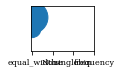

In [2142]:
tmp = pd.DataFrame(rows)
coordinates = {}
for _, row in tmp.iterrows():
    bm = 'None' if row['binning_method'] is None else row['binning_method']
    if bm not in coordinates:
        coordinates[bm] = 0
    coordinates[bm] += 1
    
fig, ax = plutils.get_fig(1/2)
xs = []
ys = []
ss = []
for i, (x, s) in enumerate(coordinates.items()):
        xs.append(i)
        ys.append(x)
        ss.append(s * 30)
ax.scatter(np.zeros(len(xs)), xs, s=ss)
ax.set_ylim((-2, 2))
# ax.set_ylabel("PHMM Duration")
ax.set_yticks([])
ax.set_xticks(np.arange(len(xs)))
ax.set_xticklabels(ys)
plt.tight_layout()
plt.savefig(f"{chosen_classifier}-binning-methods.pdf")

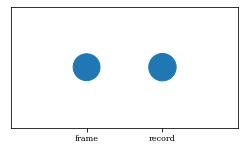

In [1346]:
tmp = pd.DataFrame(rows)
coordinates = {}
for _, row in tmp.iterrows():
    bm = 'None' if row['seq_element_type'] is None else row['seq_element_type']
    if bm not in coordinates:
        coordinates[bm] = 0
    coordinates[bm] += 1
    
fig, ax = plutils.get_fig(1)
xs = []
ys = []
ss = []
for i, (x, s) in enumerate(coordinates.items()):
        xs.append(i)
        ys.append(x)
        ss.append(s * 30)
ax.scatter(xs, np.zeros(len(xs)), s=ss)
ax.set_ylim((-2, 2))
ax.set_xlim((-1, 2))
# ax.set_ylabel("PHMM Duration")
ax.set_yticks([])
ax.set_xticks(np.arange(len(xs)))
ax.set_xticklabels(ys)
plt.tight_layout()
plt.savefig(f"{chosen_classifier}-seq-element-types.pdf")

In [2310]:
plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif"})

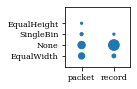

In [2328]:
to_tex = {
    'frequency': 'EqualHeight',
    'singlebin': 'SingleBin',
    'None': 'None',
    'equal_width': 'EqualWidth',
    'geometric': 'Logarithmic'
}
tmp = pd.DataFrame(rows)
coordinates = {}
for _, row in tmp.iterrows():
    bm = 'None' if row['binning_method'] is None else row['binning_method']
    st = 'None' if row['seq_element_type'] is None else row['seq_element_type']
    st = 'packet' if st == 'frame' else st
    st = 'record' if st == 'record' else st
    if bm not in coordinates:
        coordinates[bm] = {'packet': 0, 'record': 0}
    if st not in coordinates[bm]:
        coordinates[bm][st] = 0
    coordinates[bm][st] += 1
    
fig, ax = plutils.get_fig(0.5)
xs = []
ys = []
ss = []
xlabels = list(coordinates.keys())
ylabels = []
for i, (meth, data) in enumerate(coordinates.items()):
    ylabels = list(data.keys()) if list(data.keys()) > ylabels else ylabels
    for j, (stype, count) in enumerate(data.items()):
        xs.append(i)
        ys.append(j)
        ss.append(count * 5)
ax.scatter(ys, xs, s=ss)
# ax.set_ylabel("Sequence Element")
ax.set_xticks(np.arange(len(ylabels)))
ax.set_xticklabels(ylabels)
ax.set_yticks(np.arange(len(xlabels)))
ax.set_yticklabels([to_tex[l] for l in xlabels], fontdict={'variant': 'small-caps'})#, rotation=330, ha='left')
ax.set_xlim((-0.5, 1.5))
ax.set_ylim((-1, 4.5))
fig.subplots_adjust(left=.47, bottom=.2, right=.99, top=.98)
plt.savefig(f"{chosen_classifier}-binning-vs-seq-type.pdf")

In [2193]:
coordinates

{'equal_width': {'pckt': 10, 'rec': 2},
 'None': {'pckt': 7, 'rec': 19},
 'geometric': {'rec': 4, 'pckt': 3},
 'singlebin': {'pckt': 2},
 'frequency': {'pckt': 2}}

# Visualize MC

In [1873]:
import networkx as nx

In [2587]:
def load_mc_graph(trial_dir: str) -> nx.DiGraph:
    with open(os.path.join(trial_dir, 'model.json'), 'r') as fh:
        d = json.load(fh)
    g = nx.DiGraph()
    for u, v, x in d['edges']:
        g.add_edge(u, v, weight=x['probability'])
    return g


def get_label(trial_dir: str) -> str:
    with open(os.path.join(trial_dir, 'model.json'), 'r') as fh:
        d = json.load(fh)
    return d['label']

    
def plot_mc(trial_dir: str, ax=None) -> plt.Axes:
    if ax is None:
        ax = plt.subplot()
    g = load_mc_graph(trial_dir)
    pos = nx.drawing.nx_agraph.graphviz_layout(g, prog='neato')
    cmap = plt.cm.magma_r
    norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
    ax = plt.subplot()
    nx.draw_networkx_nodes(g, pos=pos, node_color='grey')
    nx.draw_networkx_edges(g, edgelist=[e for e in g.edges()], pos=pos, width=3,
                           edge_color=[cmap(norm(g.edges[e]['weight'])) for e in g.edges()])
    nx.draw_networkx_labels(g, pos=pos, font_weight='bold')
    ax.axis('off')
    return ax

In [2585]:
td_mc = '/opt/project/data/grid-search-results/cba2dd76a9ed4a17ae3e993ba2f19867_0'

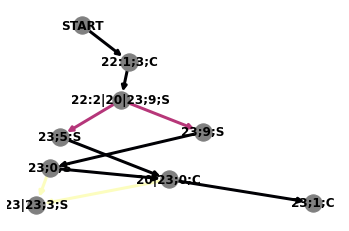

In [2590]:
ax = plot_mc(td_mc)
plt.savefig(f'mc-graph-{get_label(td_mc).replace(".", "-")}.pdf')

# Visualize PHMM

In [2714]:
td_phmm = '/opt/project/data/grid-search-results/4d233d1254a347b2add37f1816eaa7fd_0'
td_phmm = '/opt/project/data/grid-search-results/a03a3e9c63b349a6b8b20636caa40fcc_0'

In [2722]:
def make_phmm_trans_graph(d) -> nx.DiGraph:
    g = nx.DiGraph()
    for k, p in d['p_ij'].items():
        u, v = eval(k)
        if (u == v):
            v = 's' + v
        g.add_edge(u, v, weight=p)
    return g


def s_to_y(s: str):
    if s in ['end', 'start']:
        return 0
    elif s.startswith('s'):
        return s_to_y(s[1:])
    else:
        if s.startswith('i'):
            return 1
        elif s.startswith('d'):
            return 0
        else:
            return -1

def s_to_x(s: str, duration: int) -> float:
    if s == 'start':
        return 0
    elif s == 'end':
        return duration * step + step
    elif s.startswith('s'):
        return s_to_x(s[1:], duration) - step / 2
    elif s.startswith('i'):
        return step * (int(s.split('_')[-1]) + 1 / 2)
    else:
        return step * int(s.split('_')[-1])
    
    

def get_top_obs(d, num_top_obs) -> Dict[str, List[Tuple[str, float]]]:
    obs = {}
    for k, p in d['p_o_in_i'].items():
        o, x = eval(k)
        if x not in obs:
            obs[x] = []
        obs[x].append((o, p))
    for k in obs.keys():
        obs[k].sort(key=lambda x: -1 * x[-1])
        obs[k] = obs[k][:num_top_obs]
    return obs


def plot_phmm(td_phmm, num_top_obs=5, step=3, pheight=0.2):
    with open(os.path.join(td_phmm, 'model.json'), 'r') as fh:
        d = json.load(fh)
    g = make_phmm_trans_graph(d)
    pos = {n:(s_to_x(n, d['duration']), s_to_y(n)) for n in g.nodes()}
    obs = get_top_obs(d, num_top_obs)
    
    ax = plt.subplot()
    fig = plt.gcf()
    fig.set_figheight(5)
    fig.set_figwidth(d['duration'] * step)
    cmap = plt.cm.magma_r
    norm = matplotlib.colors.Normalize(vmin=0, vmax=1)
    
    nx.draw_networkx_nodes(g, pos=pos, node_size=600)
    nx.draw_networkx_edges(g, edgelist=[e for e in g.edges()], pos=pos, width=3,
                           edge_color=[cmap(norm(g.edges[e]['weight'])) for e in g.edges()])
    nx.draw_networkx_labels(g, pos=pos, font_weight='bold')
    
    for s in obs.keys():
        x, y = pos[s]
        for idx, (o, p) in enumerate(obs[s]):   
            if s.startswith('i'):
                yp = y + pheight * idx + 0.3 + idx * 0.05
            else:
                yp = y - pheight * idx - 0.5 - idx * 0.05
            p = plt.Rectangle((x, yp), height=pheight, width=step / 4 * 3 * p)
            ax.add_patch(p)
            ax.text(x, yp + pheight / 2, o)
    ax.set_ylim(-2.75, 2.75)
    ax.set_xlim(-0.5, (d['duration'] + 1) * step + 0.5)
    plt.axis('off')
    return fig, ax

(<Figure size 1080x360 with 1 Axes>, <AxesSubplot:>)

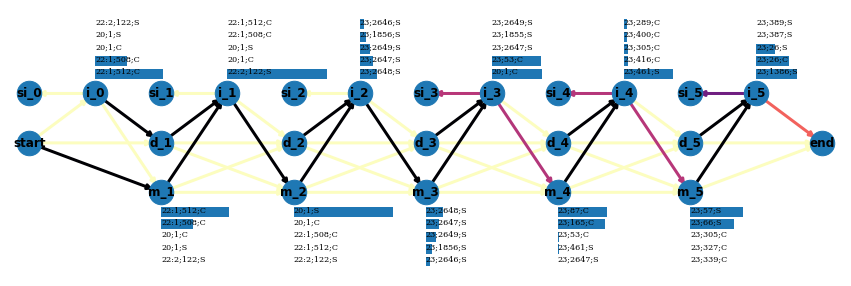

In [2723]:
plot_phmm(td_phmm)

In [2727]:
rows[0]

{'binning_method': 'equal_width',
 'num_bins': 40.0,
 'seq_length': 5,
 'hmm_duration': 5.0,
 'seq_element_type': 'frame',
 'accuracy': 1.0,
 'precision': 1.0,
 'recall': 1.0,
 'trial_dir': '/opt/project/data/grid-search-results/072e258ac4594aa7b2b249394b09ee49_0',
 'label': 'chaturbate.com'}

chaturbate.com 5.0 5 frame 1.0


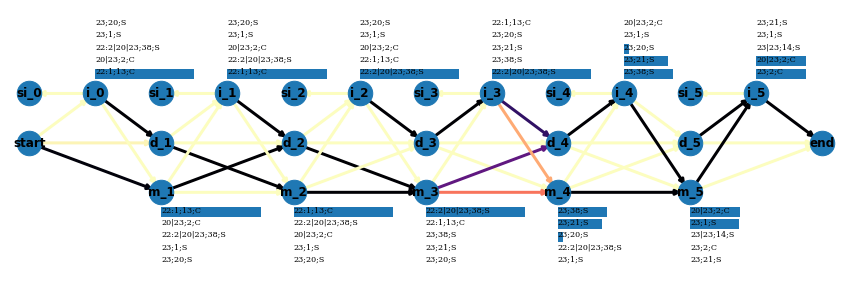

chouftv.ma 15.0 10 frame 0.6411149825783972


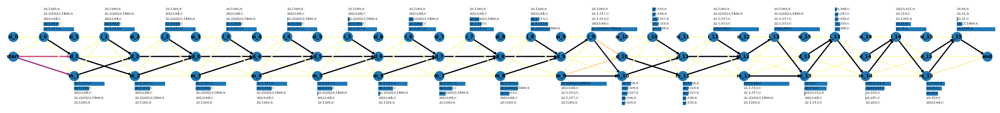

daftsex.com 5.0 10 record 0.8380487804878048


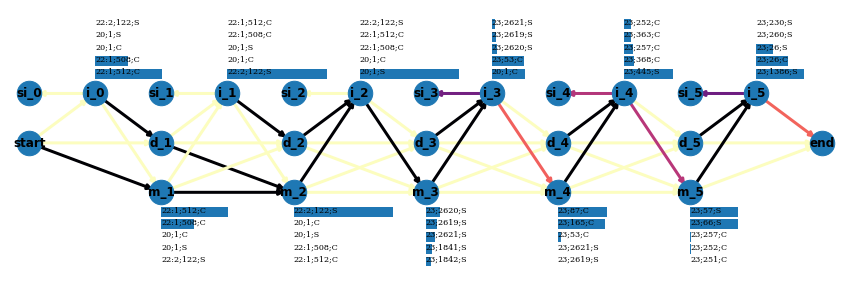

medium.com 5.0 10 record 0.3874195854181558


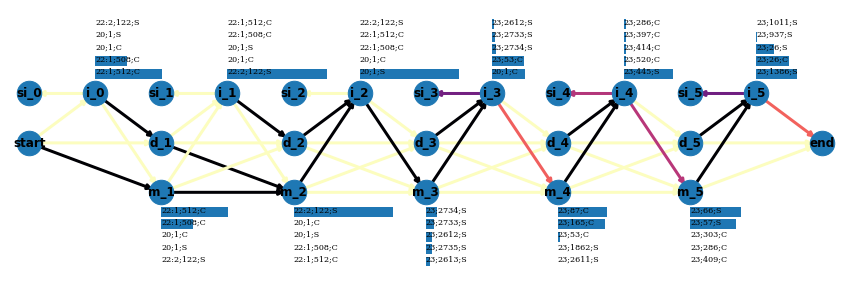

namnak.com 10.0 10 frame 1.0


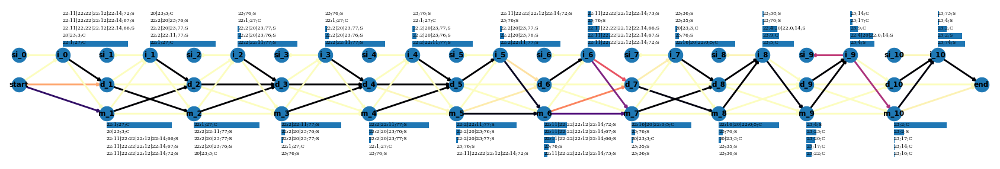

namu.wiki 5.0 10 record 0.6834208552138035


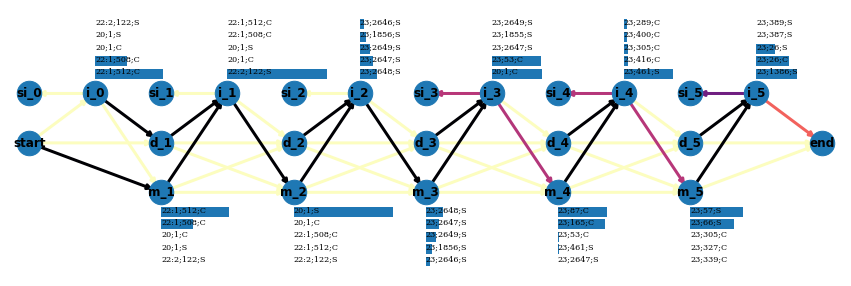

softonic.com 5.0 5 record 1.0


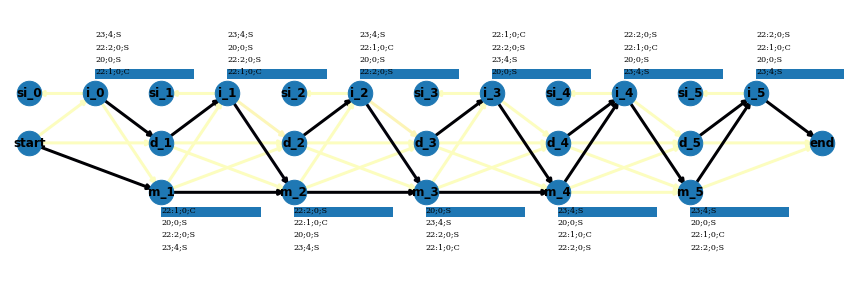

spankbang.com 5.0 10 frame 0.596195652173913


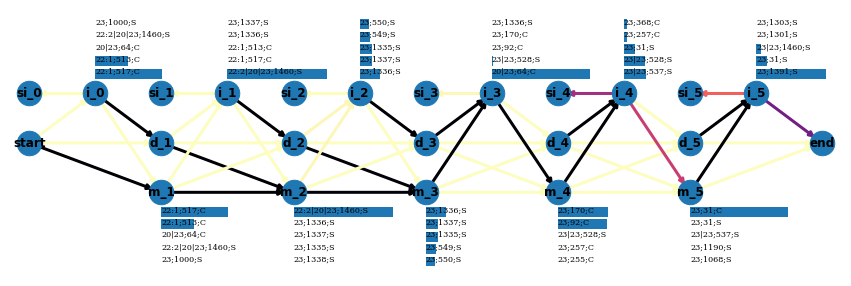

txxx.com 30.0 30 frame 0.7099099099099099


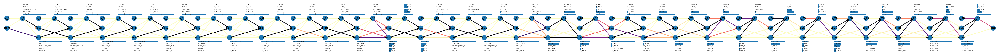

www.amazon.co.jp 5.0 5 frame 1.0


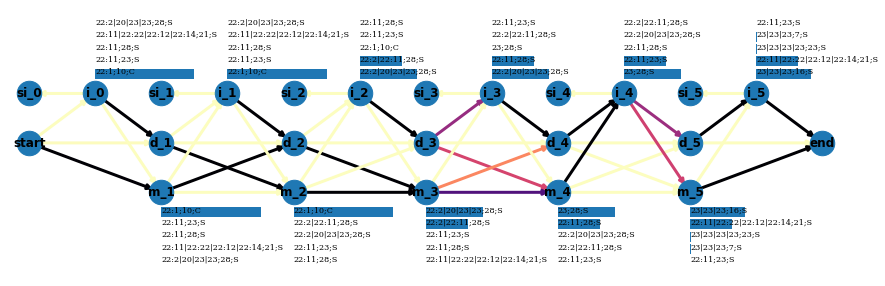

www.amazon.com 5.0 5 record 1.0


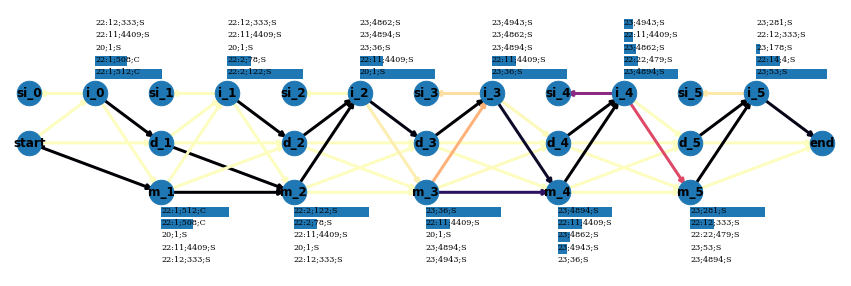

www.amazon.in 30.0 5 record 1.0


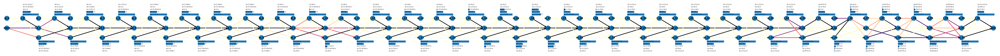

www.bola.net 5.0 5 record 1.0


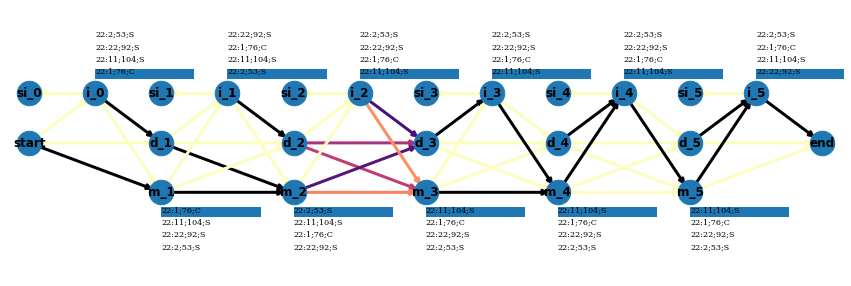

www.brilio.net 15.0 5 record 1.0


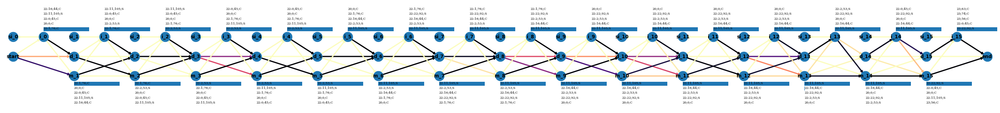

www.cnet.com 5.0 5 frame 1.0


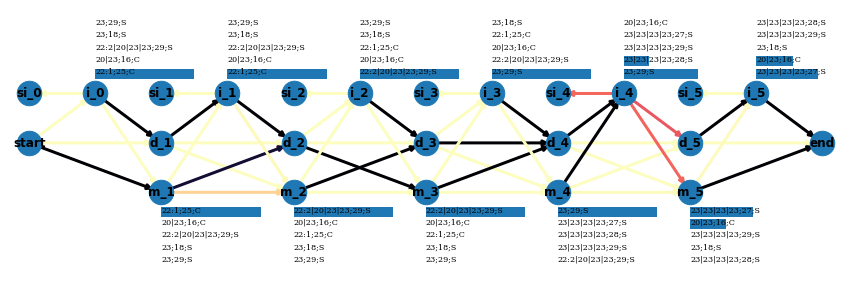

www.ebay-kleinanzeigen.de 5.0 5 frame 1.0


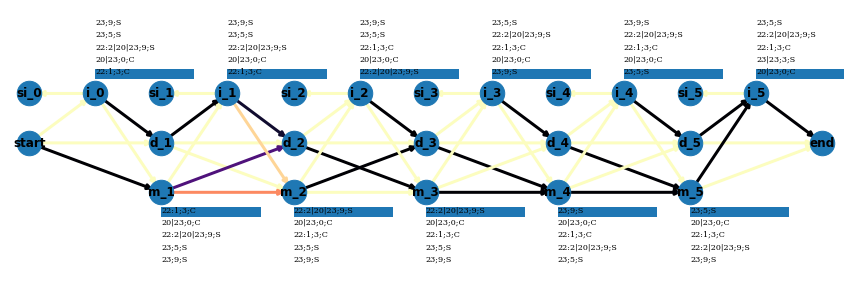

www.ebay.ca 5.0 10 record 0.30563002680965146


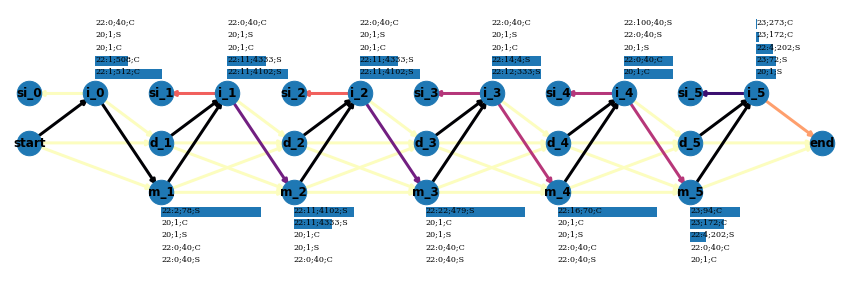

www.ebay.co.uk 15.0 10 record 0.36074074074074075


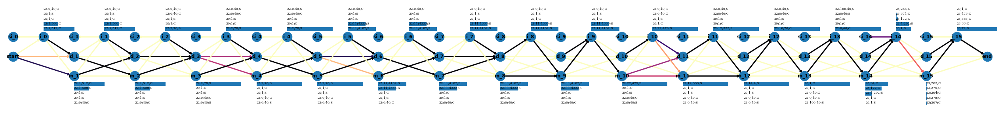

www.ebay.com.au 10.0 15 frame 0.4395879732739421


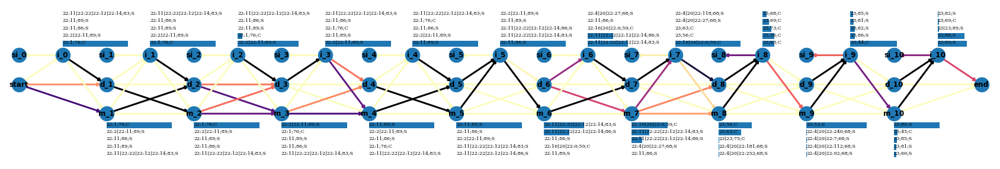

www.elbalad.news 5.0 10 record 0.639269406392694


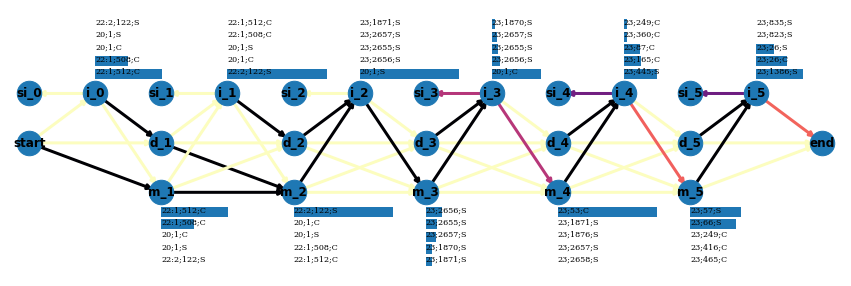

www.espn.com 5.0 5 record 1.0


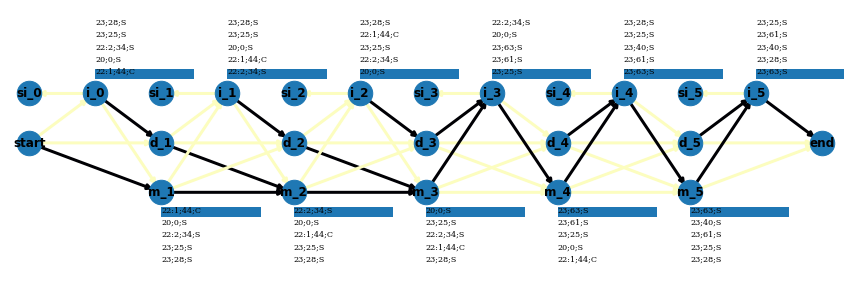

www.flashscore.com 15.0 5 frame 1.0


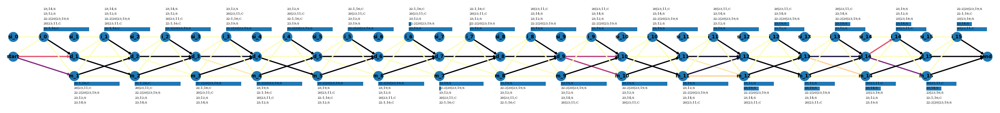

www.google.com.br 15.0 5 frame 0.345595353339787


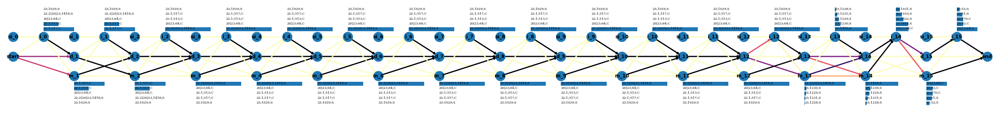

www.google.com.hk 5.0 10 record 0.653954802259887


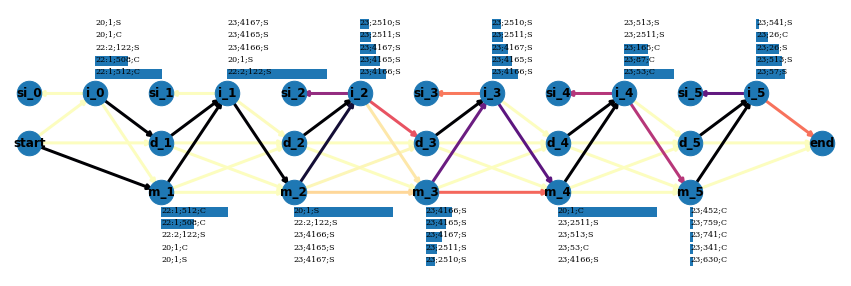

www.google.de 20.0 5 record 1.0


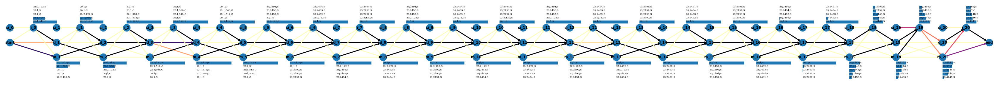

www.google.es 30.0 5 frame 0.4314199395770393


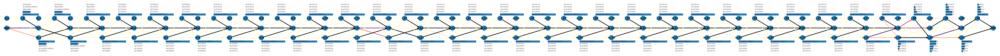

www.google.fr 30.0 5 frame 0.4068038879359634


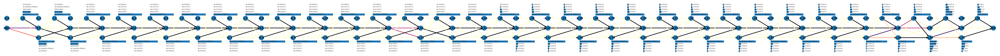

www.google.ru 5.0 5 frame 1.0


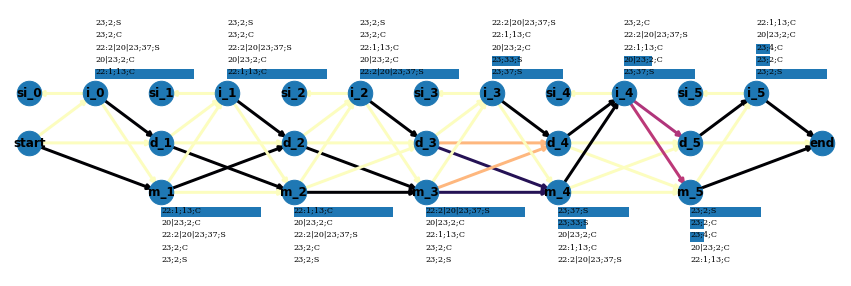

www.grammarly.com 15.0 5 frame 1.0


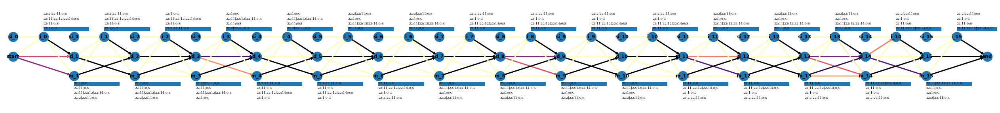

www.healthline.com 30.0 5 record 1.0


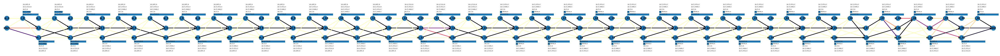

www.imdb.com 20.0 5 record 1.0


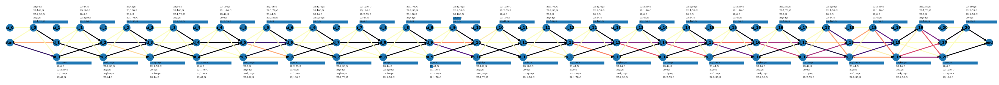

www.inquirer.net 20.0 5 frame 0.1425804278255011


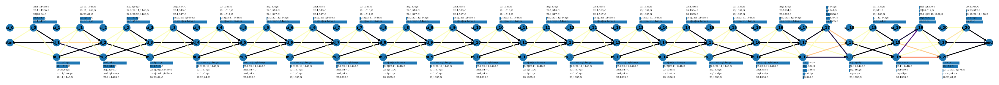

www.instagram.com 5.0 5 frame 1.0


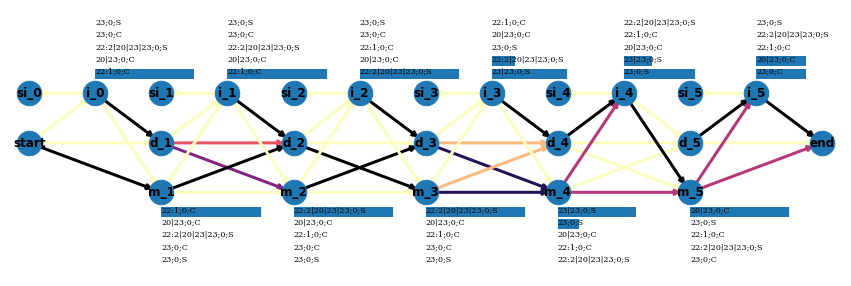

www.kompas.com 30.0 5 record 1.0


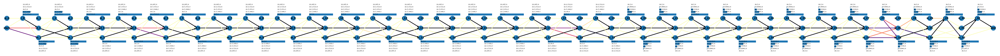

www.ladbible.com 5.0 10 record 0.8231884057971014


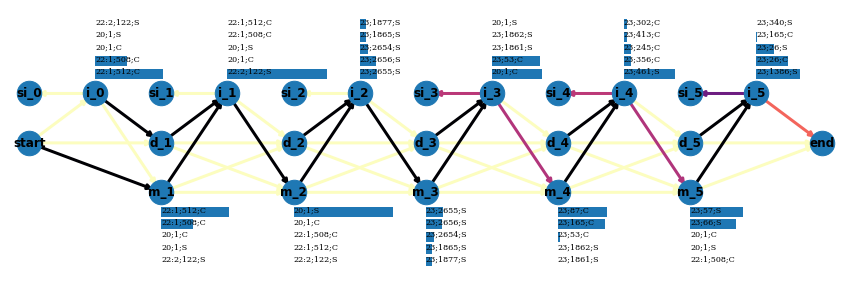

www.metropoles.com 5.0 10 record 0.8722966014418125


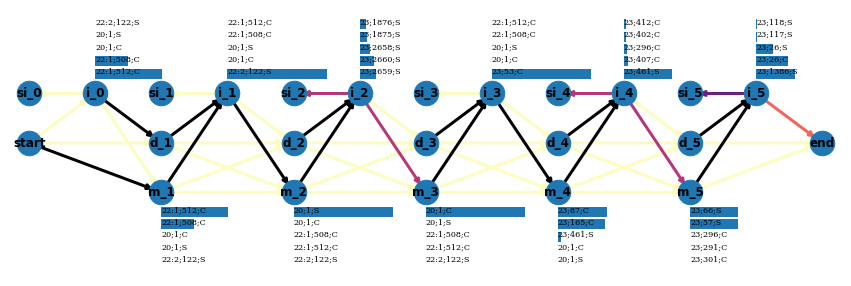

www.nih.gov 20.0 5 record 1.0


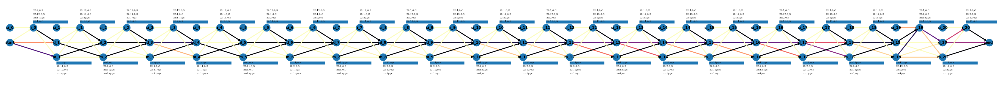

www.okta.com 5.0 5 frame 1.0


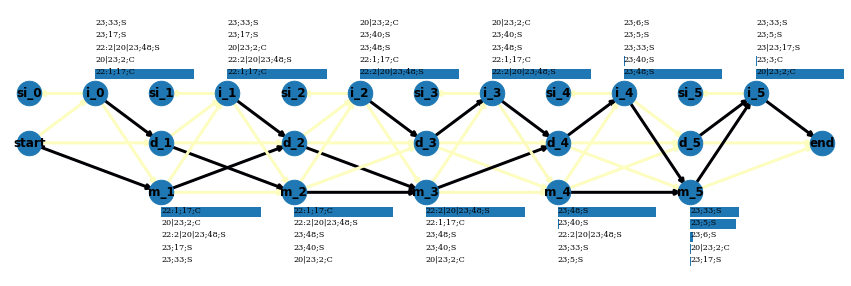

www.primevideo.com 25.0 5 record 1.0


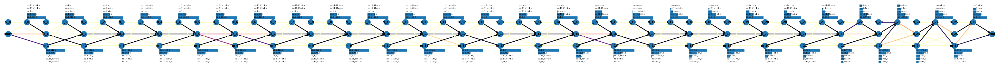

www.shutterstock.com 20.0 5 record 1.0


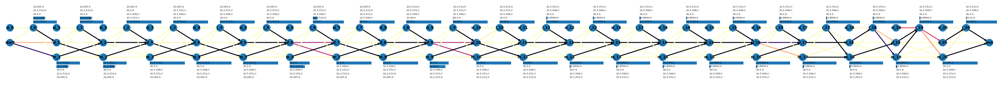

www.tahiamasr.com 10.0 10 record 0.35945273631840796


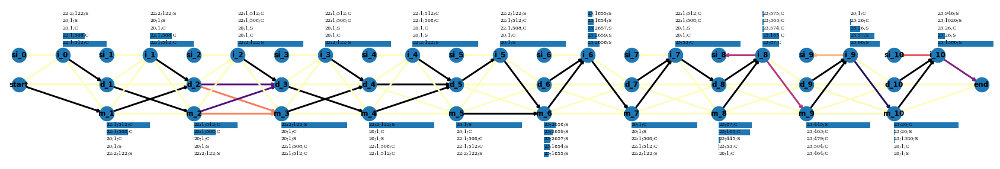

www.theepochtimes.com 5.0 5 frame 1.0


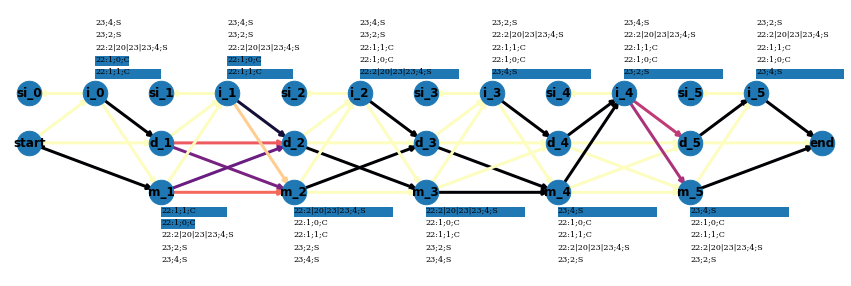

www.trendyol.com 5.0 5 frame 1.0


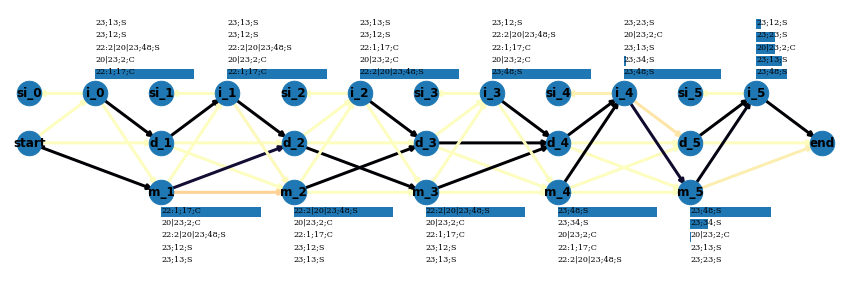

www.uber.com 5.0 5 frame 1.0


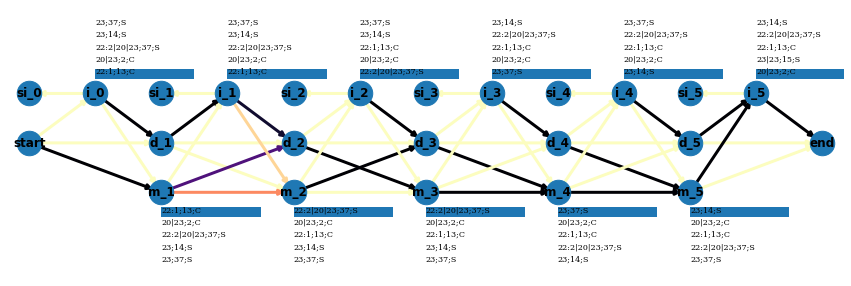

www.vidio.com 5.0 5 frame 1.0


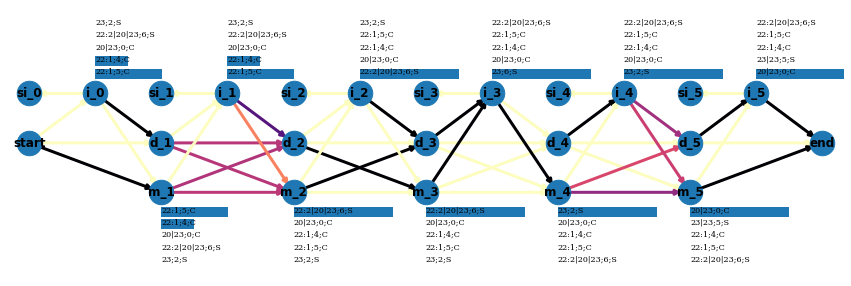

www.worldometers.info 5.0 10 record 0.7913887204366282


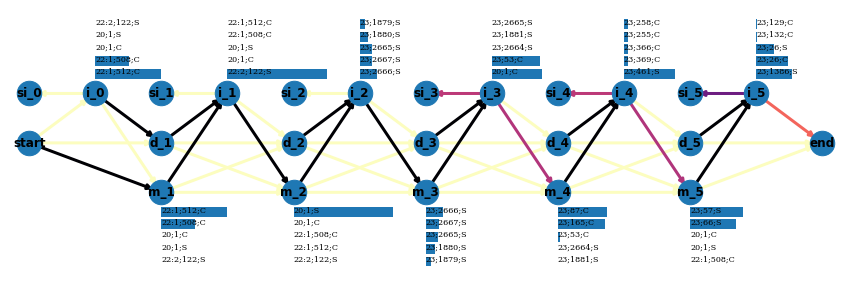

www.youm7.com 5.0 10 record 0.6424936386768448


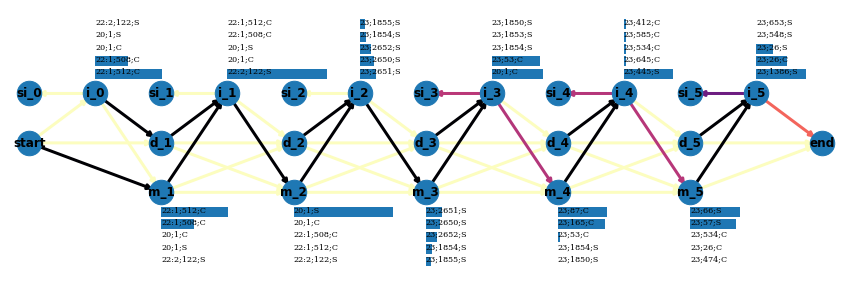

xhamster.com 10.0 10 frame 0.5293367346938775


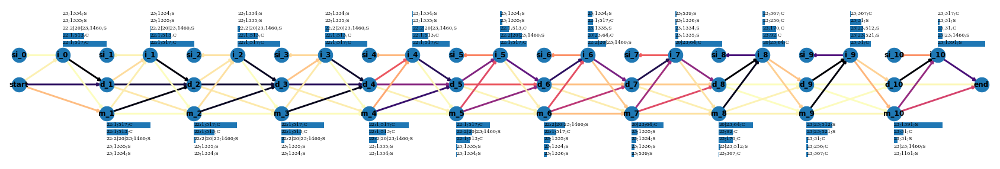

zoom.us 30.0 5 frame 1.0


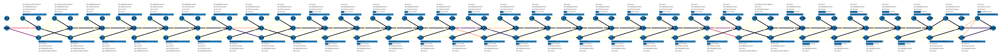

In [2730]:
for _, row in pd.DataFrame.from_dict(rows).iterrows():
    td = row['trial_dir']
    print(row['label'], row['hmm_duration'], row['seq_length'], row['seq_element_type'], row['precision'])
    fig, ax = plot_phmm(td)
    plt.savefig(f'hmms/{row["label"].replace(".", "-")}.pdf')
    plt.show()
    plt.close(fig)

In [2701]:
def export_phmm_for_web(td_phmm, num_top_obs=5):
    with open(os.path.join(td_phmm, 'model.json'), 'r') as fh:
        d = json.load(fh)
    g = make_phmm_trans_graph(d)
    pos = {n:(s_to_x(n), s_to_y(n)) for n in g.nodes()}
    obs = get_top_obs(d, num_top_obs)
    
    json_export = {'edges': [], 'nodes': [], 'observations': {}}
    for u, v in g.edges():
        json_export['edges'].append({
            'tail': u,
            'head': v,
            'probability': g.edges[(u, v)]['weight']
        })
    for k, v in pos.items():
        json_export['nodes'].append({
            'name': k,
            'x': v[0],
            'y': v[1]
        })
    for s, elements in obs.items():
        json_export['observations'][s] = [{'observation': o, 'probability': p} for o, p in elements]
    return json_export

In [2703]:
with open('sample_export.json', 'w') as fh:
    json.dump(export_phmm_for_web(td_phmm), fh)

# Evaluate KNN Closed World

In [1769]:
knn_trial_dirs = get_knn_result_dirs('/opt/project/data/grid-search-results')
knn_trial_dirs = [td for td in trial_dirs if td.find("world") == -1]

In [1770]:
len(knn_trial_dirs)

122

In [1771]:
overview_dfs = [get_accuracy_def(td) for td in knn_trial_dirs]

In [1772]:
[x.mean().mean() for x in overview_dfs]

[0.9058991718694938,
 0.9043322984347107,
 0.8813418154257819,
 0.8765496351840062,
 0.8810740516948704,
 0.8810740516948704,
 0.8813310890649679,
 0.8771226971389762,
 0.8820204634805143,
 0.8810740516948704,
 0.9043322984347107,
 0.904832578375946,
 0.9066702232047907,
 0.8813310890649679,
 0.9053680823693034,
 0.9047101344750609,
 0.8771226971389762,
 0.903564941862796,
 0.9036537841933707,
 0.8771226971389762,
 0.9066702232047907,
 0.9051616078138175,
 0.9047101344750609,
 0.8813418154257819,
 0.8813310890649679,
 0.9053680823693034,
 0.904832578375946,
 0.9066702232047907,
 0.9047101344750609,
 0.8810740516948704,
 0.9047101344750609,
 0.8770458891081494,
 0.9036537841933707,
 0.8771226971389762,
 0.9051616078138175,
 0.8765496351840062,
 0.9051616078138175,
 0.904832578375946,
 0.8813418154257819,
 0.9043322984347107,
 0.8765496351840062,
 0.87599820374779,
 0.8771226971389762,
 0.8813310890649679,
 0.8813418154257819,
 0.904832578375946,
 0.9043322984347107,
 0.8765496351840062,

In [1773]:
overview_dfs_precision = [get_precision_df(td) for td in knn_trial_dirs]
precisions_knn = [x.mean().mean() for x in overview_dfs_precision]
print("Best precision", np.argmax(precisions_knn), np.max(precisions_knn))
precisions_knn

Best precision 12 0.9124004177974399


[0.9117842178962443,
 0.9105308464687261,
 0.8887811287255752,
 0.8855288369262694,
 0.8891079973814983,
 0.8891079973814983,
 0.8888205301651647,
 0.8862111711100633,
 0.8889051218971877,
 0.8891079973814983,
 0.9105308464687261,
 0.9113930082340129,
 0.9124004177974399,
 0.8888205301651647,
 0.9117896523679972,
 0.9113721410759237,
 0.8862111711100633,
 0.9112803033466557,
 0.9109394945023871,
 0.8862111711100633,
 0.9124004177974399,
 0.9118239821106081,
 0.9113721410759237,
 0.8887811287255752,
 0.8888205301651647,
 0.9117896523679972,
 0.9113930082340129,
 0.9124004177974399,
 0.9113721410759237,
 0.8891079973814983,
 0.9113721410759237,
 0.8857137143987899,
 0.9109394945023871,
 0.8862111711100633,
 0.9118239821106081,
 0.8855288369262694,
 0.9118239821106081,
 0.9113930082340129,
 0.8887811287255752,
 0.9105308464687261,
 0.8855288369262694,
 0.885430787736772,
 0.8862111711100633,
 0.8888205301651647,
 0.8887811287255752,
 0.9113930082340129,
 0.9105308464687261,
 0.88552883692

In [420]:
overview_dfs_recall = [get_recall_df(td) for td in knn_trial_dirs]
[x.mean().mean() for x in overview_dfs_recall]

[0.9058991718694938,
 0.9043322984347107,
 0.8813418154257819,
 0.8765496351840062,
 0.8810740516948704,
 0.8810740516948704,
 0.8813310890649679,
 0.8771226971389762,
 0.8820204634805143,
 0.8810740516948704,
 0.9043322984347107,
 0.904832578375946,
 0.9066702232047907,
 0.8813310890649679,
 0.9053680823693034,
 0.9047101344750609,
 0.8771226971389762,
 0.903564941862796,
 0.9036537841933707,
 0.8771226971389762,
 0.9066702232047907,
 0.9051616078138175,
 0.9047101344750609,
 0.8813418154257819,
 0.8813310890649679,
 0.9053680823693034,
 0.904832578375946,
 0.9066702232047907,
 0.9047101344750609,
 0.8810740516948704,
 0.9047101344750609,
 0.8770458891081494,
 0.9036537841933707,
 0.8771226971389762,
 0.9051616078138175,
 0.8765496351840062,
 0.9051616078138175,
 0.904832578375946,
 0.8813418154257819,
 0.9043322984347107,
 0.8765496351840062,
 0.87599820374779,
 0.8771226971389762,
 0.8813310890649679,
 0.8813418154257819,
 0.904832578375946,
 0.9043322984347107,
 0.8765496351840062,

In [421]:
np.argmax(precisions_knn)

12

In [422]:
with open(f'{knn_trial_dirs[12]}/config.json', 'r') as fh:
    best_knn_config = json.load(fh)
print(json.dumps(best_knn_config, indent=1))

{
 "uuid_": "047f435fd54642f4b2674ac21e08d27f",
 "accuracy": 0.9039107646821664,
 "trial_dir": "/opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f_0",
 "classifier": "knn",
 "binning_method": "equal_width",
 "num_bins": 40,
 "day_train_start": 0,
 "day_train_end": 30,
 "seq_length": 30,
 "seq_element_type": "record",
 "hmm_length": null,
 "hmm_duration": null,
 "knn_num_neighbors": 9,
 "seed": 1,
 "hmm_init_prior": null,
 "hmm_num_iter": null,
 "ano_density_estimator": null,
 "bin_edges": null,
 "max_bin_size": 16384,
 "label": null,
 "fp": null,
 "fn": null,
 "tp": null,
 "tn": null
}


## Evaluate agreement

In [524]:
with open("/opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f_agreement/agreement.json", 'r') as fh:
    agreement = json.load(fh)

In [526]:
all_agreements = np.concatenate([v for v in agreement.values()])

In [527]:
pd.Series(all_agreements).describe()

count    74410.000000
mean         0.922534
std          0.161590
min          0.222222
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
dtype: float64

{'bodies': [<matplotlib.collections.PolyCollection at 0x7fbfd1fb8070>],
 'cmaxes': <matplotlib.collections.LineCollection at 0x7fbfa5266070>,
 'cmins': <matplotlib.collections.LineCollection at 0x7fbfd1fb8400>,
 'cbars': <matplotlib.collections.LineCollection at 0x7fbfd1fb8310>}

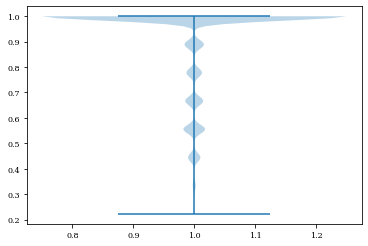

In [528]:
plt.violinplot(all_agreements)

In [531]:
5/9

0.5555555555555556

# Open World Scenario

In [85]:
def aggregate_label(common_prefixes: List[str], label: str) -> str:
    new_label = label
    for prefix in common_prefixes:
        if label.startswith(prefix):
            new_label = prefix
            break
    return new_label


def aggregate_common_prefixes(common_prefixes: List[str], conf_mat: Dict[str, Dict[str, float]]):
    new_conf_mat = {}
    for actual, results in conf_mat.items():
        new_actual = aggregate_label(common_prefixes, actual)
        if new_actual not in new_conf_mat: new_conf_mat[new_actual] = {}
        for predicted, value in results.items():
            new_predicted = aggregate_label(common_prefixes, predicted)
            if new_predicted not in new_conf_mat[new_actual]: new_conf_mat[new_actual][new_predicted] = 0
            new_conf_mat[new_actual][new_predicted] += value
    return new_conf_mat

In [86]:
def violin_compare_metrics(recall_phmm: pd.DataFrame, recall_mc: pd.DataFrame,
                           recall_knn: pd.DataFrame, precision_phmm: pd.DataFrame,
                           precision_mc: pd.DataFrame, precision_knn: pd.DataFrame) -> Tuple[plt.Figure, plt.Axes]:
    fig, ax = plutils.get_fig(0.66)
    labels = ['kNN', 'MC', 'PHMM']
    matplotlib.rcParams.update({'font.size': 8})
    x = [0, 1, 2]
    y1 = recall_phmm.values.flatten() 
    y2 = recall_mc.values.flatten()
    y3 = recall_knn.values.flatten()
    y1 = y1[np.logical_not(np.isnan(y1))]
    y2 = y2[np.logical_not(np.isnan(y2))]
    y3 = y3[np.logical_not(np.isnan(y3))]
    y= [y3, y2, y1]
    parts = ax.violinplot(
        y,
        positions=x,
        showmeans=False,
        showmedians=False,
        widths=1
    )
    for partname in ('cbars','cmins','cmaxes'):
        vp = parts[partname].set_edgecolor([COLORS[0], COLORS[1], COLORS[2]])
    for i, pc in enumerate(parts['bodies']):
        pc.set_color(COLORS[i])
    for i, v in enumerate(y):
        ax.scatter(np.repeat(x[i], 100), v[np.random.randint(0, v.size, 100)], alpha=0.2, marker='_', c=COLORS[i])
    for i, (x_, y_) in enumerate(zip(x, y)):
        ax.scatter([x_], [np.mean(y_)], marker=MARKERS[i], edgecolors='black', zorder=2 , facecolor='white', linewidths=1.25)
        ax.scatter([x_], [np.median(y_)], marker="_", facecolor='black', zorder=2)

    x = [4, 5, 6]
    y1 = precision_phmm.values.flatten()
    y2 = precision_mc.values.flatten()
    y3 = precision_knn.values.flatten()
    y1 = y1[np.logical_not(np.isnan(y1))]
    y2 = y2[np.logical_not(np.isnan(y2))]
    y3 = y3[np.logical_not(np.isnan(y3))]
    y= [y3, y2, y1]
    parts = ax.violinplot(
        y,
        positions=x,
        showmeans=False,
        showmedians=False,
        widths=1
    )
    for partname in ('cbars','cmins','cmaxes'):
        vp = parts[partname].set_edgecolor([COLORS[0], COLORS[1], COLORS[2]])
    for i, pc in enumerate(parts['bodies']):
        pc.set_color(COLORS[i])
    for i, v in enumerate(y):
        ax.scatter(np.repeat(x[i], 100), v[np.random.randint(0, v.size, 100)], alpha=0.3, marker='_', c=COLORS[i])
    for i, (x_, y_) in enumerate(zip(x, y)):
        ax.scatter([x_], [np.mean(y_)], marker=MARKERS[i], zorder=2, label=labels[i], edgecolors='black', facecolor='white', linewidths=1.25)
        ax.scatter([x_], [np.median(y_)], marker="_", zorder=2, facecolor='black')
    # ax.scatter(x, [np.mean(t) for t in y], marker=[MARKERS[0], MARKERS[1], MARKERS[2]], c=[COLORS[0], COLORS[1], COLORS[2]])

    #ax.scatter([0], [3], label='kNN', c=COLORS[0])
    #ax.scatter([0], [3], label='MC', c=COLORS[1])
    #ax.scatter([0], [3], label='PHMM', c=COLORS[2])
    ax.set_ylim((-0.1, 1.1))
    ax.set_xlim((-1, 7.5))
    ax.set_xticks([1, 5])
    ax.set_xticklabels(['Recall', 'Precision'])
    ax.legend(frameon=False, ncol=2)
    ax.set_ylabel("Fraction")
    return fig, ax

In [87]:
import time

In [88]:
def mean_aboslute_deviation(x: np.array) -> Tuple[np.array, np.array]:
    mean = np.mean(x, axis=1)
    mad = np.mean(np.abs(x - np.expand_dims(mean, -1)), axis=1)
    return mean, mad

In [89]:
def line_plot_compare_metric(dfs: List[pd.DataFrame], labels: List[str],
                             xlabel: str, ylabel: str, xlim=None, ylim=None,
                             linewidth=1.25, markevery=5, markersize=5,
                             ncols=1, legend_cols=1) -> Tuple[plt.Figure, plt.Axes]:
    fig, ax = plutils.get_fig(0.66)#, aspect_ratio=0.7)
    for i, df in enumerate(dfs):
        ax.plot(df.mean(axis=1), c=COLORS[i], label=labels[i],
               linewidth=linewidth, marker=MARKERS[i % len(MARKERS)],
                markevery=15, markersize=markersize)
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.set_xticks(np.arange(10, 70, 25))
    ax.set_xticklabels(np.arange(10, 70, 25))
    ax.legend(frameon=False, ncol=legend_cols)
    return fig, ax

In [90]:
with open('/opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f-open-world-eval-2/timings.json', 'r') as fh:
    timings = json.load(fh)

In [91]:
pd.Series(timings).describe()

count    149354.000000
mean          1.446643
std           0.618882
min           0.242554
25%           0.830542
50%           1.449828
75%           1.842103
max           5.385385
dtype: float64

In [92]:
with open('/opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f-open-world-eval-2/config.json', 'r') as fh:
    cfg2 = json.load(fh)
with open('/opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f-open-world-eval/config.json', 'r') as fh:
    cfg1 = json.load(fh)

In [93]:
for k, v in cfg2.items():
    print(f"{k}: {cfg1[k]}\t\t{k}: {v}")

uuid_: 047f435fd54642f4b2674ac21e08d27f		uuid_: 047f435fd54642f4b2674ac21e08d27f
accuracy: 0.46027558686074693		accuracy: 0.35839804716496315
trial_dir: /opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f-open-world-eval		trial_dir: /opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f-open-world-eval-2
classifier: knn		classifier: knn
binning_method: equal_width		binning_method: equal_width
num_bins: 40		num_bins: 40
day_train_start: 0		day_train_start: 0
day_train_end: 72		day_train_end: 72
seq_length: 30		seq_length: 30
seq_element_type: record		seq_element_type: record
hmm_length: None		hmm_length: None
hmm_duration: None		hmm_duration: None
knn_num_neighbors: 9		knn_num_neighbors: 9
seed: 1		seed: 1
hmm_init_prior: None		hmm_init_prior: None
hmm_num_iter: None		hmm_num_iter: None
ano_density_estimator: None		ano_density_estimator: None
bin_edges: None		bin_edges: None
max_bin_size: 16384		max_bin_size: 16384
label: None		label: None
fp: None		fp

In [94]:
os.path.getmtime('/opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f-open-world-eval/config.json')

1627467292.4375072

In [95]:
open_precision_mc['classifier'] = 'MC'
open_precision_phmm['classifier'] = 'PHMM'
open_precision_knn['classifier'] = 'kNN'

open_precision_mc.columns

Index(['www.nih.gov', 'chaturbate.com', 'chouftv.ma', 'www.youm7.com',
       'unknown', 'daftsex.com', 'www.shutterstock.com', 'www.tahiamasr.com',
       'www.grammarly.com', 'spankbang.com', 'www.metropoles.com',
       'www.worldometers.info', 'www.inquirer.net', 'www.brilio.net',
       'medium.com', 'xhamster.com', 'www.healthline.com', 'www.elbalad.news',
       'www.cnet.com', 'www.imdb.com', 'www.ladbible.com', 'www.ebay',
       'www.bola.net', 'www.amazon', 'www.primevideo.com', 'txxx.com',
       'namu.wiki', 'www.vidio.com', 'www.okta.com', 'www.kompas.com',
       'www.flashscore.com', 'www.espn.com', 'www.theepochtimes.com',
       'www.trendyol.com', 'www.uber.com', 'zoom.us', 'namnak.com',
       'www.instagram.com', 'softonic.com', 'www.google', 'classifier'],
      dtype='object')

In [96]:
cnct = pd.concat([open_precision_mc, open_precision_phmm, open_precision_knn])

In [97]:
cnct.head()

,www.nih.gov,chaturbate.com,chouftv.ma,www.youm7.com,unknown,daftsex.com,www.shutterstock.com,www.tahiamasr.com,www.grammarly.com,spankbang.com,...,www.espn.com,www.theepochtimes.com,www.trendyol.com,www.uber.com,zoom.us,namnak.com,www.instagram.com,softonic.com,www.google,classifier
0,1.0,1.0,0.485714,1.000000,0.571247,0.625000,1.0,0.736842,1.0,0.545455,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.90,0.589888,MC
1,1.0,1.0,0.400000,1.000000,0.571610,0.666667,1.0,0.500000,1.0,0.545455,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.90,0.544944,MC
2,1.0,1.0,0.500000,0.888889,0.579747,0.583333,1.0,0.700000,1.0,0.590909,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.95,0.559322,MC
3,1.0,1.0,0.352941,1.000000,0.565605,0.500000,1.0,0.578947,1.0,0.619048,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.00,0.569832,MC
4,1.0,1.0,0.361111,1.000000,0.586076,0.583333,1.0,0.600000,1.0,0.545455,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.95,0.572222,MC


In [2524]:
cnct.reset_index().set_index(['index', 'classifier']).sort_index().unstack().to_csv('precision-overview.csv')

In [98]:
common_prefixes = ['www.amazon', 'www.google', 'www.ebay']

In [99]:
with open('/opt/project/open-world-labels.json', 'r') as fh:
    open_world_labels = json.load(fh)
with open('/opt/project/closed-world-labels.json', 'r') as fh:
    closed_world_labels = json.load(fh)

In [100]:
name = f'open-world-phmm-results-all-data-loaded'
with open(f'/opt/project/data/grid-search-results/{name}/conf-mats.json', 'r') as fh:
    phmm_conf_mats = json.load(fh)
name = f'open-world-mc-results-all-data-loaded'
with open(f'/opt/project/data/grid-search-results/{name}/conf-mats.json', 'r') as fh:
    mc_conf_mats = json.load(fh)

In [101]:
with open('/opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f-closed-world-eval/conf-mats.json', 'r') as fh:
    knn_conf_mats_closed = json.load(fh)
knn_conf_mats_closed = {f'{k:d}': v for k, v in enumerate(knn_conf_mats_closed) if len(v) > 0}
with open('/opt/project/data/grid-search-results/047f435fd54642f4b2674ac21e08d27f-open-world-eval-old-commit/conf-mats.json', 'r') as fh:
    knn_conf_mats = json.load(fh)
knn_conf_mats = {f'{k:d}': v for k, v in enumerate(knn_conf_mats) if len(v) > 0}  

In [102]:
open_recall_phmm = pd.DataFrame.from_dict([get_recall_open(s, closed_world_labels) for s in phmm_conf_mats.values() if type(s) == dict])
open_recall_mc   = pd.DataFrame.from_dict([get_recall_open(s, closed_world_labels) for s in mc_conf_mats.values()   if type(s) == dict])
open_recall_knn  = pd.DataFrame.from_dict([get_recall_open(s, closed_world_labels) for s in knn_conf_mats.values()   if type(s) == dict and len(s) > 0])

open_precision_phmm = pd.DataFrame.from_dict([get_precision_open(s, closed_world_labels) for s in phmm_conf_mats.values() if type(s) == dict])
open_precision_mc   = pd.DataFrame.from_dict([get_precision_open(s, closed_world_labels) for s in mc_conf_mats.values()   if type(s) == dict])
open_precision_knn  = pd.DataFrame.from_dict([get_precision_open(s, closed_world_labels) for s in knn_conf_mats.values()   if type(s) == dict and len(s) > 0])
                                         
open_accuracy_phmm = pd.DataFrame.from_dict([get_accuracy_open(s, closed_world_labels) for s in phmm_conf_mats.values() if type(s) == dict])
open_accuracy_mc   = pd.DataFrame.from_dict([get_accuracy_open(s, closed_world_labels) for s in mc_conf_mats.values()   if type(s) == dict])
open_accuracy_knn  = pd.DataFrame.from_dict([get_accuracy_open(s, closed_world_labels) for s in knn_conf_mats.values()   if type(s) == dict and len(s) > 0])

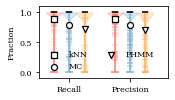

In [2204]:
fig, ax = violin_compare_metrics(open_recall_phmm, open_recall_mc, open_recall_knn,
                       open_precision_phmm, open_precision_mc, open_precision_knn)
# fig.subplots_adjust(left=.1, bottom=.16, right=.99, top=.97)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.98)
plt.savefig('open-world-recall-precision.pdf')

In [103]:
print(f"Precision:\n\t PHMM \t  MC  \t  KNN\n\t{open_precision_phmm.mean().mean():.4f}\t{open_precision_mc.mean().mean():.4f}\t{open_precision_knn.mean().mean():.4f}\t")
print(f"Recall:\n\t PHMM \t  MC  \t  KNN\n\t{open_recall_phmm.mean().mean():.4f}\t{open_recall_mc.mean().mean():.4f}\t{open_recall_knn.mean().mean():.4f}\t")
print(f"Accuracy:\n\t PHMM \t  MC  \t  KNN\n\t{open_accuracy_phmm.mean().mean():.4f}\t{open_accuracy_mc.mean().mean():.4f}\t{open_accuracy_knn.mean().mean():.4f}\t")

Precision:
	 PHMM 	  MC  	  KNN
	0.7076	0.7871	0.8871	
Recall:
	 PHMM 	  MC  	  KNN
	0.7127	0.7899	0.8880	
Accuracy:
	 PHMM 	  MC  	  KNN
	0.7010	0.7765	0.8820	


In [120]:
pd.concat((open_precision_phmm.mean(), open_precision_mc.mean(), open_precision_knn.mean()), axis=1)

,0,1,2
www.nih.gov,1.000000,1.000000,1.000000
chaturbate.com,0.947403,1.000000,0.981463
chouftv.ma,0.309977,0.547934,0.975201
www.youm7.com,0.199138,0.990913,0.996627
xhamster.com,0.086330,0.226780,0.849429
txxx.com,0.893816,0.980357,0.992857
www.tahiamasr.com,0.245417,0.535616,0.983447
namu.wiki,0.813142,0.545022,0.887492
unknown,0.385238,0.586480,0.255970
www.shutterstock.com,1.000000,1.000000,0.975293


In [2013]:
parts = ax.violinplot([np.random.randn(100), np.random.randn(100)])

In [2014]:
parts['bodies'][0]

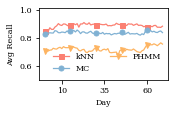

In [2015]:
fig, ax = line_plot_compare_metric([open_recall_knn, open_recall_mc, open_recall_phmm],
                                   ['kNN', 'MC', 'PHMM'], 'Day', 'Avg Recall',
                                  ylim=(0.5, 1.01), legend_cols=2)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.98)
plt.savefig("open-world-recall-over-time.pdf")
plt.show()

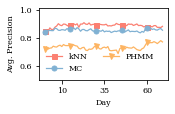

In [2016]:
fig, ax = line_plot_compare_metric([open_precision_knn, open_precision_mc, open_precision_phmm],
                                   ['kNN', 'MC', 'PHMM'], 'Day', 'Avg. Precision',
                                  ylim=(0.5, 1.01), legend_cols=2)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.98)
plt.savefig("open-world-precision-over-time.pdf")

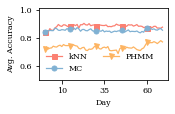

In [2017]:
fig, ax = line_plot_compare_metric([open_accuracy_knn, open_accuracy_mc, open_accuracy_phmm],
                                   ['kNN', 'MC', 'PHMM'], 'Day', 'Avg. Accuracy',
                                  ylim=(0.5, 1.01), legend_cols=2)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.98)
plt.savefig("open-world-accuracy-over-time.pdf")

In [1946]:
summary = {}
lbl = "www.tahiamasr.com"
for day in phmm_conf_mats.values():
    for k, v in day[lbl].items():
        if k not in summary:
            summary[k] = 0
        summary[k] += v
confusion = "\n\t".join([f"{k:20s}\t{v:5d}" for k, v in summary.items()])
print(f"{lbl} gets confused as follows: \n\t{confusion}")

www.tahiamasr.com gets confused as follows: 
	www.tahiamasr.com   	  349
	www.inquirer.net    	  980
	xhamster.com        	   58
	unknown             	   32


#### Check values with stuff aggregated

In [105]:
closed_world_labels_plus_agg = [s for s in closed_world_labels]
closed_world_labels_plus_agg.extend(common_prefixes)

In [106]:
fct = lambda s, f: f(aggregate_common_prefixes(common_prefixes, s), closed_world_labels_plus_agg)
open_recall_phmm = pd.DataFrame.from_dict([fct(s, get_recall_open) for s in phmm_conf_mats.values() if type(s) == dict])
open_recall_mc   = pd.DataFrame.from_dict([fct(s, get_recall_open) for s in mc_conf_mats.values()   if type(s) == dict])
open_recall_knn  = pd.DataFrame.from_dict([fct(s, get_recall_open) for s in knn_conf_mats.values()  if type(s) == dict and len(s) > 0])

open_precision_phmm = pd.DataFrame.from_dict([fct(s, get_precision_open) for s in phmm_conf_mats.values() if type(s) == dict])
open_precision_mc   = pd.DataFrame.from_dict([fct(s, get_precision_open) for s in mc_conf_mats.values()   if type(s) == dict])
open_precision_knn  = pd.DataFrame.from_dict([fct(s, get_precision_open) for s in knn_conf_mats.values()  if type(s) == dict and len(s) > 0])
                                         
open_accuracy_phmm = pd.DataFrame.from_dict([fct(s, get_accuracy_open) for s in phmm_conf_mats.values() if type(s) == dict])
open_accuracy_mc   = pd.DataFrame.from_dict([fct(s, get_accuracy_open) for s in mc_conf_mats.values()   if type(s) == dict])
open_accuracy_knn  = pd.DataFrame.from_dict([fct(s, get_accuracy_open) for s in knn_conf_mats.values()  if type(s) == dict and len(s) > 0])

(<Figure size 163.944x101.317 with 1 Axes>, <AxesSubplot:ylabel='Fraction'>)

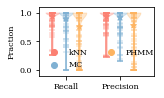

In [2020]:
violin_compare_metrics(open_recall_phmm, open_recall_mc, open_recall_knn,
                       open_precision_phmm, open_precision_mc, open_precision_knn)

In [2021]:
print(f"Precision:\n\t PHMM \t  MC  \t  KNN\n\t{open_precision_phmm.mean().mean():.4f}\t{open_precision_mc.mean().mean():.4f}\t{open_precision_knn.mean().mean():.4f}\t")
print(f"Recall:\n\t PHMM \t  MC  \t  KNN\n\t{open_recall_phmm.mean().mean():.4f}\t{open_recall_mc.mean().mean():.4f}\t{open_recall_knn.mean().mean():.4f}\t")
print(f"Accuracy:\n\t PHMM \t  MC  \t  KNN\n\t{open_accuracy_phmm.mean().mean():.4f}\t{open_accuracy_mc.mean().mean():.4f}\t{open_accuracy_knn.mean().mean():.4f}\t")

Precision:
	 PHMM 	  MC  	  KNN
	0.7729	0.9131	0.9280	
Recall:
	 PHMM 	  MC  	  KNN
	0.7535	0.8902	0.9292	
Accuracy:
	 PHMM 	  MC  	  KNN
	0.7729	0.9131	0.9217	


In [107]:
print(f"Precision:\n\t PHMM \t  MC  \t  KNN\n\t{open_precision_phmm.mean().mean():.4f}\t{open_precision_mc.mean().mean():.4f}\t{open_precision_knn.mean().mean():.4f}\t")
print(f"Recall:\n\t PHMM \t  MC  \t  KNN\n\t{open_recall_phmm.mean().mean():.4f}\t{open_recall_mc.mean().mean():.4f}\t{open_recall_knn.mean().mean():.4f}\t")
print(f"Accuracy:\n\t PHMM \t  MC  \t  KNN\n\t{open_accuracy_phmm.mean().mean():.4f}\t{open_accuracy_mc.mean().mean():.4f}\t{open_accuracy_knn.mean().mean():.4f}\t")

Precision:
	 PHMM 	  MC  	  KNN
	0.7275	0.8244	0.9280	
Recall:
	 PHMM 	  MC  	  KNN
	0.7331	0.8282	0.9292	
Accuracy:
	 PHMM 	  MC  	  KNN
	0.7186	0.8104	0.9217	


In [117]:
np.sum(open_precision_mc.min().values > 0.9)

20

In [118]:
open_precision_mc.min().shape

(40,)

In [109]:
open_precision_mc.shape[0]

70

In [110]:
open_precision_mc.mean().mean()

0.8243642684830483

## Closed World

In [2205]:
name = f'closed-world-phmm-results-all-data-loaded'
with open(f'/opt/project/data/grid-search-results/{name}/conf-mats.json', 'r') as fh:
    phmm_conf_mats = json.load(fh)
name = f'closed-world-mc-results-all-data-loaded'
with open(f'/opt/project/data/grid-search-results/{name}/conf-mats.json', 'r') as fh:
    mc_conf_mats = json.load(fh)

In [2206]:
closed_recall_phmm = pd.DataFrame.from_dict([get_recall(s, closed_world_labels) for s in phmm_conf_mats.values() if type(s) == dict])
closed_recall_mc   = pd.DataFrame.from_dict([get_recall(s, closed_world_labels) for s in mc_conf_mats.values()   if type(s) == dict])
closed_recall_knn  = pd.DataFrame.from_dict([get_recall(s, closed_world_labels) for s in knn_conf_mats_closed.values()   if type(s) == dict])

closed_precision_phmm = pd.DataFrame.from_dict([get_precision(s, closed_world_labels) for s in phmm_conf_mats.values() if type(s) == dict])
closed_precision_mc   = pd.DataFrame.from_dict([get_precision(s, closed_world_labels) for s in mc_conf_mats.values()   if type(s) == dict])
closed_precision_knn  = pd.DataFrame.from_dict([get_precision(s, closed_world_labels) for s in knn_conf_mats_closed.values()   if type(s) == dict])
                                         
closed_accuracy_phmm = pd.DataFrame.from_dict([get_accuracy(s, closed_world_labels) for s in phmm_conf_mats.values() if type(s) == dict])
closed_accuracy_mc   = pd.DataFrame.from_dict([get_accuracy(s, closed_world_labels) for s in mc_conf_mats.values()   if type(s) == dict])
closed_accuracy_knn  = pd.DataFrame.from_dict([get_accuracy(s, closed_world_labels) for s in knn_conf_mats_closed.values()   if type(s) == dict])

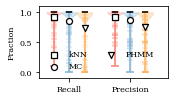

In [2207]:
fig, ax = violin_compare_metrics(closed_recall_phmm, closed_recall_mc, closed_recall_knn,
                       closed_precision_phmm, closed_precision_mc, closed_precision_knn)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.98)
plt.savefig('closed-world-recall-precision.pdf')

In [2025]:
print(f"Precision:\n\t PHMM \t  MC  \t  KNN\n\t{closed_precision_phmm.mean().mean():.4f}\t{closed_precision_mc.mean().mean():.4f}\t{closed_precision_knn.mean().mean():.4f}\t")
print(f"Recall:\n\t PHMM \t  MC  \t  KNN\n\t{closed_recall_phmm.mean().mean():.4f}\t{closed_recall_mc.mean().mean():.4f}\t{closed_recall_knn.mean().mean():.4f}\t")
print(f"Accuracy:\n\t PHMM \t  MC  \t  KNN\n\t{closed_accuracy_phmm.mean().mean():.4f}\t{closed_accuracy_mc.mean().mean():.4f}\t{closed_accuracy_knn.mean().mean():.4f}\t")

Precision:
	 PHMM 	  MC  	  KNN
	0.7574	0.8651	0.9180	
Recall:
	 PHMM 	  MC  	  KNN
	0.7340	0.8535	0.9144	
Accuracy:
	 PHMM 	  MC  	  KNN
	0.7340	0.8535	0.9144	


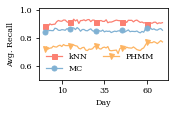

In [2026]:
fig, ax = line_plot_compare_metric([closed_recall_knn, closed_recall_mc, closed_recall_phmm],
                                   ['kNN', 'MC', 'PHMM'], 'Day', 'Avg. Recall',
                                  ylim=(0.5, 1.01), legend_cols=2)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.98)
plt.savefig("closed-world-recall-over-time.pdf")

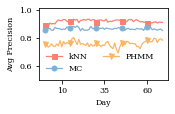

In [2027]:
fig, ax = line_plot_compare_metric([closed_precision_knn, closed_precision_mc, closed_precision_phmm],
                                   ['kNN', 'MC', 'PHMM'], 'Day', 'Avg Precision',
                                  ylim=(0.5, 1.01), legend_cols=2)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.98)
plt.savefig("closed-world-precision-over-time.pdf")

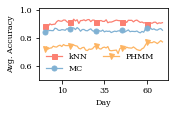

In [2028]:
fig, ax = line_plot_compare_metric([closed_accuracy_knn, closed_accuracy_mc, closed_accuracy_phmm],
                                   ['kNN', 'MC', 'PHMM'], 'Day', 'Avg. Accuracy',
                                  ylim=(0.5, 1.01), legend_cols=2)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.98)
plt.savefig("closed-world-accuracy-over-time.pdf")

#### Compare aggregated

In [2029]:
fct = lambda s, f: f(aggregate_common_prefixes(common_prefixes, s), closed_world_labels_plus_agg)
closed_recall_phmm = pd.DataFrame.from_dict([fct(s, get_recall) for s in phmm_conf_mats.values() if type(s) == dict])
closed_recall_mc   = pd.DataFrame.from_dict([fct(s, get_recall) for s in mc_conf_mats.values()   if type(s) == dict])
closed_recall_knn  = pd.DataFrame.from_dict([fct(s, get_recall) for s in knn_conf_mats_closed.values()  if type(s) == dict])

closed_precision_phmm = pd.DataFrame.from_dict([fct(s, get_precision) for s in phmm_conf_mats.values() if type(s) == dict])
closed_precision_mc   = pd.DataFrame.from_dict([fct(s, get_precision) for s in mc_conf_mats.values()   if type(s) == dict])
closed_precision_knn  = pd.DataFrame.from_dict([fct(s, get_precision) for s in knn_conf_mats_closed.values()  if type(s) == dict])
                                         
closed_accuracy_phmm = pd.DataFrame.from_dict([fct(s, get_accuracy) for s in phmm_conf_mats.values() if type(s) == dict])
closed_accuracy_mc   = pd.DataFrame.from_dict([fct(s, get_accuracy) for s in mc_conf_mats.values()   if type(s) == dict])
closed_accuracy_knn  = pd.DataFrame.from_dict([fct(s, get_accuracy) for s in knn_conf_mats_closed.values()  if type(s) == dict])

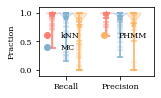

In [2030]:
violin_compare_metrics(closed_recall_phmm, closed_recall_mc, closed_recall_knn,
                       closed_precision_phmm, closed_precision_mc, closed_precision_knn)
fig.subplots_adjust(left=.0, bottom=.0, right=.99, top=.99)

In [2031]:
print(f"Precision:\n\t PHMM \t  MC  \t  KNN\n\t{closed_precision_phmm.mean().mean():.4f}\t{closed_precision_mc.mean().mean():.4f}\t{closed_precision_knn.mean().mean():.4f}\t")
print(f"Recall:\n\t PHMM \t  MC  \t  KNN\n\t{closed_recall_phmm.mean().mean():.4f}\t{closed_recall_mc.mean().mean():.4f}\t{closed_recall_knn.mean().mean():.4f}\t")
print(f"Accuracy:\n\t PHMM \t  MC  \t  KNN\n\t{closed_accuracy_phmm.mean().mean():.4f}\t{closed_accuracy_mc.mean().mean():.4f}\t{closed_accuracy_knn.mean().mean():.4f}\t")

Precision:
	 PHMM 	  MC  	  KNN
	0.8011	0.9233	0.9719	
Recall:
	 PHMM 	  MC  	  KNN
	0.7729	0.9131	0.9699	
Accuracy:
	 PHMM 	  MC  	  KNN
	0.7729	0.9131	0.9699	


In [1766]:
closed_precision_phmm

,www.nih.gov,chaturbate.com,chouftv.ma,www.youm7.com,xhamster.com,txxx.com,www.tahiamasr.com,namu.wiki,www.shutterstock.com,www.inquirer.net,...,www.theepochtimes.com,www.trendyol.com,www.uber.com,zoom.us,namnak.com,www.instagram.com,softonic.com,www.metropoles.com,www.google,www.primevideo.com
0,0.937500,1.000000,0.888889,0.368421,0.000000,0.593750,0.545455,0.687500,1.0,0.128205,...,1.0,1.0,1.0,1.0,1.000000,1.0,0.0,1.000000,1.0,1.0
1,0.937500,1.000000,0.909091,0.631579,0.086957,0.791667,0.875000,0.923077,1.0,0.122581,...,1.0,1.0,1.0,1.0,0.923077,1.0,0.0,0.333333,1.0,1.0
2,0.937500,1.000000,0.625000,0.500000,0.052632,0.655172,0.500000,0.818182,1.0,0.122581,...,1.0,1.0,1.0,1.0,0.923077,1.0,0.0,1.000000,1.0,1.0
3,0.935484,1.000000,0.615385,0.571429,0.090909,0.894737,0.571429,0.733333,1.0,0.128205,...,1.0,1.0,1.0,1.0,1.000000,1.0,0.0,0.000000,1.0,1.0
4,0.937500,1.000000,0.666667,0.571429,0.066667,0.600000,0.454545,0.724138,1.0,0.138889,...,1.0,1.0,1.0,1.0,0.960000,1.0,0.0,1.000000,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,0.937500,0.956522,0.750000,0.666667,0.000000,0.952381,1.000000,0.758621,1.0,0.161290,...,1.0,1.0,1.0,1.0,0.821429,1.0,0.0,1.000000,1.0,1.0
66,0.937500,1.000000,0.900000,0.647059,0.000000,0.869565,0.642857,0.758621,1.0,0.158730,...,1.0,1.0,1.0,1.0,0.920000,1.0,0.0,0.666667,1.0,1.0
67,0.937500,1.000000,0.909091,0.631579,0.000000,1.000000,0.461538,0.846154,1.0,0.152000,...,1.0,1.0,1.0,1.0,0.923077,1.0,0.0,0.666667,1.0,1.0
68,0.937500,1.000000,0.928571,0.647059,0.423077,0.863636,0.642857,0.758621,1.0,0.180180,...,1.0,1.0,1.0,1.0,0.960000,1.0,0.0,0.500000,1.0,1.0


In [1767]:
closed_precision_mc

,www.nih.gov,chaturbate.com,chouftv.ma,www.youm7.com,www.inquirer.net,daftsex.com,www.shutterstock.com,www.tahiamasr.com,www.grammarly.com,spankbang.com,...,www.flashscore.com,www.espn.com,www.theepochtimes.com,www.trendyol.com,www.uber.com,zoom.us,www.instagram.com,softonic.com,www.google,www.primevideo.com
0,0.937500,1.0,0.960000,0.689655,0.327273,0.954545,1.0,0.818182,1.0,0.541667,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.983333,1.0
1,0.937500,1.0,0.863636,0.769231,0.241379,1.000000,1.0,0.750000,1.0,0.640000,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.983333,1.0
2,0.937500,1.0,0.833333,0.695652,0.230769,1.000000,1.0,0.800000,1.0,0.583333,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.991597,1.0
3,0.935484,1.0,0.909091,0.720000,0.266667,1.000000,1.0,0.947368,1.0,0.571429,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.0
4,0.937500,1.0,0.913043,0.689655,0.361702,1.000000,1.0,0.782609,1.0,0.535714,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.991736,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,0.833333,1.0,1.000000,0.800000,0.342105,0.821429,1.0,0.818182,1.0,0.727273,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.0
66,0.882353,1.0,1.000000,0.769231,0.358974,0.888889,1.0,0.772727,1.0,0.652174,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.0
67,0.833333,1.0,0.965517,0.833333,0.375000,1.000000,1.0,0.909091,1.0,0.736842,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.0
68,0.882353,1.0,1.000000,0.833333,0.516129,0.821429,1.0,0.950000,1.0,0.789474,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.000000,1.0


<AxesSubplot:>

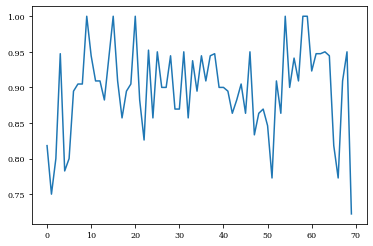

In [1768]:
closed_precision_mc['www.tahiamasr.com'].plot()

In [1578]:
phmm_conf_mats['0']['softonic.com']

{'www.espn.com': 20}

# Evaluate over time

In [2455]:
name = f'open-world-phmm-results-days-to-train-1'
with open(f'/opt/project/data/grid-search-results/{name}/timings.json', 'r') as fh:
    tmp = json.load(fh)

In [2467]:
dtt_phmm = {}
dtt_mc = {}
dtt_knn = {}
for days_to_train_on in [1, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65]:
    name = f'open-world-phmm-results-days-to-train-{days_to_train_on}'
    if os.path.exists(f'/opt/project/data/grid-search-results/{name}/conf-mats.json'):
        with open(f'/opt/project/data/grid-search-results/{name}/conf-mats.json', 'r') as fh:
            dtt_phmm[days_to_train_on] = json.load(fh)
    if os.path.exists(f'/opt/project/data/grid-search-results/{name}/conf-mats.json'):
        name = f'open-world-mc-results-days-to-train-{days_to_train_on}'
        with open(f'/opt/project/data/grid-search-results/{name}/conf-mats.json', 'r') as fh:
            dtt_mc[days_to_train_on] = json.load(fh)
    name = f"047f435fd54642f4b2674ac21e08d27f-open-world-eval-over-days-no-symbol-change-{days_to_train_on}"
    if os.path.exists(f'/opt/project/data/grid-search-results/{name}/conf-mats.json'):
        with open(f'/opt/project/data/grid-search-results/{name}/conf-mats.json', 'r') as fh:
            l = json.load(fh)
        d = 0
        tmp = {}
        for x in l:
            if len(x) == 0:
                continue
            tmp[d] = x
            d += 1
        dtt_knn[days_to_train_on] = tmp

In [2468]:
dtt_phmm_precision = {}
dtt_mc_precision = {}
dtt_knn_precision = {}
for k, conf_mats in dtt_phmm.items():
    dtt_phmm_precision[k] = pd.DataFrame.from_dict([get_precision_open(s, closed_world_labels) for s in conf_mats.values() if type(s) == dict])
for k, conf_mats in dtt_mc.items():
    dtt_mc_precision[k] = pd.DataFrame.from_dict([get_precision_open(s, closed_world_labels) for s in conf_mats.values() if type(s) == dict])
for k, conf_mats in dtt_knn.items():
    dtt_knn_precision[k] = pd.DataFrame.from_dict([get_precision_open(s, closed_world_labels) for s in conf_mats.values() if type(s) == dict])

In [2469]:
len(conf_mats[65]) * 50

4850

In [2470]:
dtt_phmm_recall = {}
dtt_mc_recall = {}
dtt_knn_recall = {}
for k, conf_mats in dtt_phmm.items():
    dtt_phmm_recall[k] = pd.DataFrame.from_dict([get_recall_open(s, closed_world_labels) for s in conf_mats.values() if type(s) == dict])
for k, conf_mats in dtt_mc.items():
    dtt_mc_recall[k] = pd.DataFrame.from_dict([get_recall_open(s, closed_world_labels) for s in conf_mats.values() if type(s) == dict])
for k, conf_mats in dtt_knn.items():
    dtt_knn_recall[k] = pd.DataFrame.from_dict([get_recall_open(s, closed_world_labels) for s in conf_mats.values() if type(s) == dict])

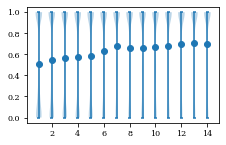

In [2471]:
fig, ax = plutils.get_fig(1)
ax.violinplot([x.values.flatten() for x in dtt_phmm_precision.values()])
ax.scatter(np.arange(1, len(dtt_mc_precision) + 1), [x.mean().mean() for x in dtt_phmm_precision.values()])

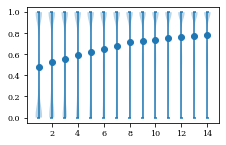

In [2472]:
fig, ax = plutils.get_fig(1)
ax.violinplot([x.values.flatten() for x in dtt_mc_precision.values()])
ax.scatter(np.arange(1, len(dtt_mc_precision) + 1), [x.mean().mean() for x in dtt_mc_precision.values()])

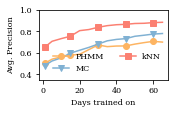

In [2473]:
fig, ax = plutils.get_fig(0.66)
ax.plot(list(dtt_phmm_precision.keys()), [x.mean().mean() for x in dtt_phmm_precision.values()], c=COLORS[2], label='PHMM', marker=MARKERS[1], markevery=3)
ax.plot(list(dtt_mc_precision.keys()), [x.mean().mean() for x in dtt_mc_precision.values()], c=COLORS[1], label='MC', marker=MARKERS[2], markevery=3)
ax.plot(list(dtt_knn_precision.keys()), [x.mean().mean() for x in dtt_knn_precision.values()], c=COLORS[0], label='kNN', marker=MARKERS[0], markevery=3)
ax.legend(frameon=False, ncol=2)
ax.set_xlabel("Days trained on")
ax.set_ylabel("Avg. Precision")
ax.set_ylim(0.35, 1)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.965)
plt.savefig('open-days-trained-on-precision.pdf')

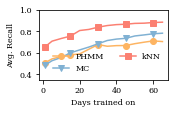

In [2474]:
fig, ax = plutils.get_fig(0.66)
ax.plot(list(dtt_phmm_recall.keys()), [x.mean().mean() for x in dtt_phmm_recall.values()], c=COLORS[2], label='PHMM', marker=MARKERS[1], markevery=3)
ax.plot(list(dtt_mc_recall.keys()), [x.mean().mean() for x in dtt_mc_recall.values()], c=COLORS[1], label='MC', marker=MARKERS[2], markevery=3)
ax.plot(list(dtt_knn_recall.keys()), [x.mean().mean() for x in dtt_knn_recall.values()], c=COLORS[0], label='kNN', marker=MARKERS[0], markevery=3)
ax.legend(frameon=False, ncol=2)
ax.set_xlabel("Days trained on")
ax.set_ylabel("Avg. Recall")
ax.set_ylim(0.35, 1)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.965)
plt.savefig('open-days-trained-on-recall.pdf')

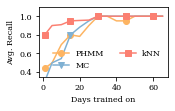

In [2475]:
fig, ax = plutils.get_fig(0.66)
ax.plot(list(dtt_phmm_recall.keys()), [np.median(x.values) for x in dtt_phmm_recall.values()], c=COLORS[2], label='PHMM', marker=MARKERS[1], markevery=3)
ax.plot(list(dtt_mc_recall.keys()), [np.median(x.values) for x in dtt_mc_recall.values()], c=COLORS[1], label='MC', marker=MARKERS[2], markevery=3)
ax.plot(list(dtt_knn_recall.keys()), [np.median(x.values) for x in dtt_knn_recall.values()], c=COLORS[0], label='kNN', marker=MARKERS[0], markevery=3)
ax.legend(frameon=False, ncol=2)
ax.set_xlabel("Days trained on")
ax.set_ylabel("Avg. Recall")
ax.set_ylim(0.35, 1.1)
fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.965)

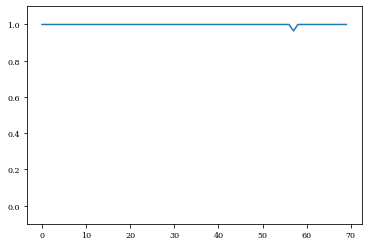

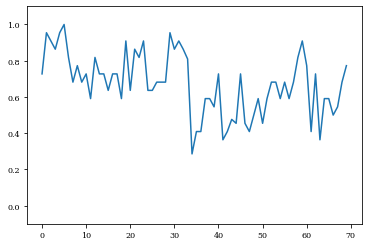

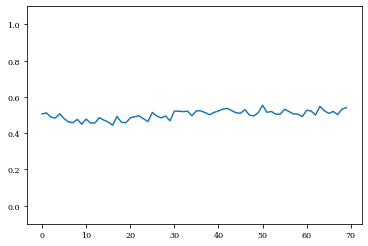

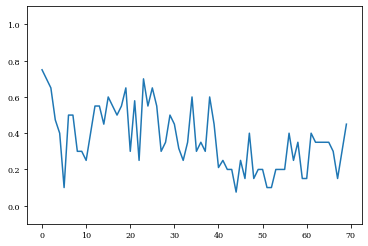

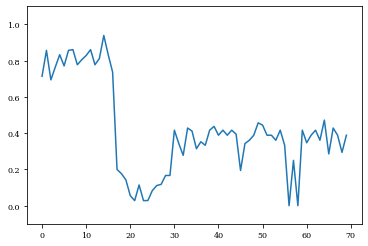

...

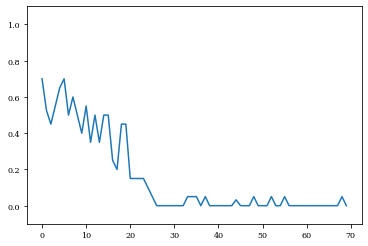

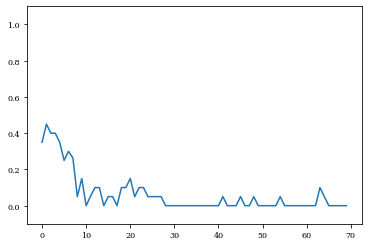

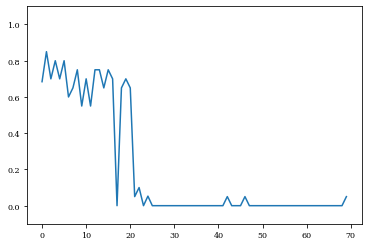

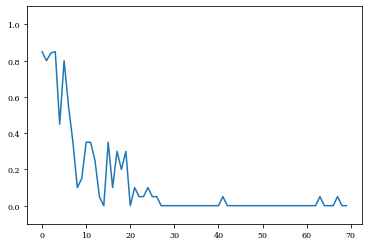

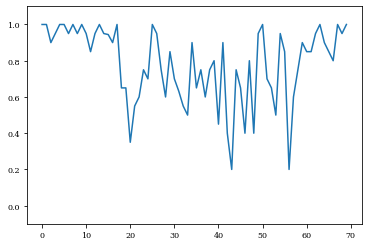

In [2476]:
for c in dtt_knn_precision[1].columns:
    ax = plt.subplot()
    ax.plot(dtt_knn_precision[1].loc[:, c])
    ax.set_ylim(-0.1, 1.1)
    plt.show()

1 0.6530910897923471 0.5038745703594045 0.4822010498973697


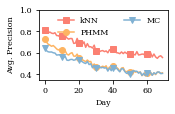

5 0.7080793474789381 0.5416852469147018 0.524967303634075


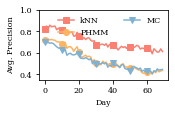

10 0.732968566003494 0.5638441656197734 0.5540786104384953


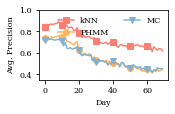

15 0.7552013543550169 0.5784396863726503 0.5981416445613572


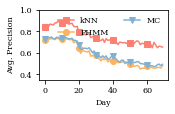

20 0.8070466405057498 0.5872308351885723 0.6248883699890218


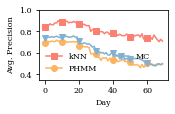

25 0.817262021842713 0.6309107144590701 0.6513795569296786


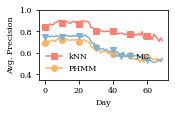

30 0.838215614296357 0.6741833348990061 0.6820567479914221


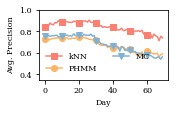

35 0.8534289322952218 0.6583598755669507 0.7123035397868204


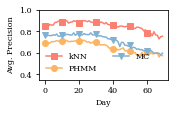

40 0.8620773968845274 0.6639128511795986 0.7255840885884431


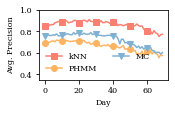

45 0.8658057281706979 0.6648296249799356 0.7325782374391211


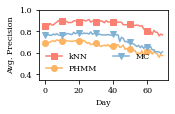

50 0.8735653417729 0.6818937209625772 0.7546873752336565


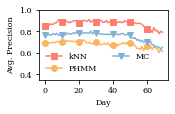

55 0.8754854637570019 0.6956114922182198 0.7644081605350741


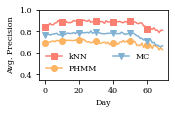

60 0.8815754524118732 0.707541421398375 0.7750553452912965


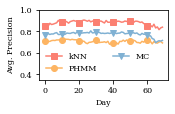

65 0.884718696337413 0.700522918740061 0.7803228815399922


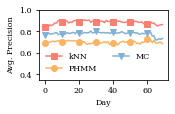

In [2477]:
for k, v in dtt_phmm_precision.items():
    fig, ax = plutils.get_fig(0.66)
    if k in dtt_knn_precision:
        ax.plot(dtt_knn_precision[k].mean(axis=1).values, label='kNN', c=COLORS[0], marker=MARKERS[0], markevery=10)
    ax.plot(v.mean(axis=1).values, label='PHMM', c=COLORS[2], marker=MARKERS[1], markevery=10)
    ax.plot(dtt_mc_precision[k].mean(axis=1).values, label='MC', c=COLORS[1], marker=MARKERS[2], markevery=10)
    # ax.set_ylim(0.6, 1.01)
    print(k, dtt_knn_precision[k].mean().mean(), v.mean().mean(), dtt_mc_precision[k].mean().mean())
    ax.set_xlabel("Day")
    ax.set_ylabel("Avg. Precision")
    ax.legend(frameon=False, ncol=2)
    ax.set_ylim(0.35, 1)
    fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.965)
    plt.savefig(f'open-days-trained-on-precision-day-{k}.pdf')
    plt.show()

<AxesSubplot:>

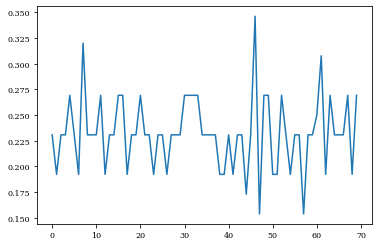

In [1643]:
dtt_mc_precision[15]['xhamster.com'].plot()

In [1657]:
pd.concat([dtt_mc_precision[5].mean(), dtt_mc_precision[65].mean(), open_precision_mc.mean()], axis=1)

,0,1,2
www.nih.gov,1.000000,1.000000,1.000000
chaturbate.com,0.904453,1.000000,1.000000
www.inquirer.net,0.410952,0.478755,0.483721
www.worldometers.info,0.464639,0.622938,0.630404
chouftv.ma,0.320108,0.537641,0.547934
www.youm7.com,0.985913,0.990556,0.990913
unknown,0.615926,0.558638,0.551848
daftsex.com,0.414247,0.645031,0.650091
www.shutterstock.com,1.000000,1.000000,1.000000
www.tahiamasr.com,0.215770,0.525104,0.535616


# Compare models

In [2478]:
slength = 65
name = f'open-world-phmm-results-days-to-train-{slength}'
td_eval = f'/opt/project/data/grid-search-results/{name}/'
td_hypr = "/opt/project/data/grid-search-results/dbca67c04c154f2e9f26fa5217b1236f_0"

In [2479]:
with open(f'/opt/project/data/grid-search-results/{name}/conf-mats.json', 'r') as fh:
    phmm_conf_mats = json.load(fh)
closed_recall_phmm = pd.DataFrame.from_dict([get_recall(s, closed_world_labels) for s in phmm_conf_mats.values() if type(s) == dict])

In [2480]:
with open(os.path.join(td_eval, 'model-www.amazon.com.json'), 'r') as fh:
    model_eval = json.load(fh)
with open(os.path.join(td_hypr, 'model.json'), 'r') as fh:
    model_hypr = json.load(fh)

In [2481]:
model_eval

{'p_ij': {"('start', 'd_1')": 1e-06,
  "('start', 'm_1')": 0.999998,
  "('start', 'i_0')": 1e-06,
  "('d_1', 'd_2')": 1e-06,
  "('d_1', 'm_2')": 0.999998,
  "('d_1', 'i_1')": 1e-06,
  "('d_2', 'd_3')": 1e-06,
  "('d_2', 'm_3')": 1e-06,
  "('d_2', 'i_2')": 0.999998,
  "('d_3', 'd_4')": 1e-06,
  "('d_3', 'm_4')": 1e-06,
  "('d_3', 'i_3')": 0.9999979999999999,
  "('d_4', 'd_5')": 1e-06,
  "('d_4', 'm_5')": 1e-06,
  "('d_4', 'i_4')": 0.999998,
  "('d_5', 'i_5')": 0.9999990000000001,
  "('d_5', 'end')": 1e-06,
  "('m_1', 'd_2')": 1e-06,
  "('m_1', 'm_2')": 0.999998,
  "('m_1', 'i_1')": 1e-06,
  "('m_2', 'd_3')": 1e-06,
  "('m_2', 'm_3')": 1e-06,
  "('m_2', 'i_2')": 0.999998,
  "('m_3', 'd_4')": 1e-06,
  "('m_3', 'm_4')": 0.9997810390491277,
  "('m_3', 'i_3')": 0.00021796095087216435,
  "('m_4', 'd_5')": 1e-06,
  "('m_4', 'm_5')": 1e-06,
  "('m_4', 'i_4')": 0.999998,
  "('m_5', 'i_5')": 0.999999,
  "('m_5', 'end')": 1e-06,
  "('i_0', 'd_1')": 0.999998,
  "('i_0', 'm_1')": 1e-06,
  "('i_0', '

In [2482]:
model_hypr['p_o']

KeyError: 'p_o'

In [2483]:
with open(os.path.join(td_eval, 'config-medium.com.json'), 'r') as fh:
    config_eval = json.load(fh)

In [2484]:
phmm_conf_mats['3']['www.ebay.co.uk']

{'www.ebay.com.au': 20}

In [2485]:
for f in os.listdir(td_eval):
    if f.find("config-") > -1:
        with open(os.path.join(td_eval, f), 'r') as fh:
            d = json.load(fh)
        print(f"{d['label']:30s}", d['max_nll_val']/d['max_nll_train'], "\t",
             d['avg_log_prob_val']/d['avg_log_prob_train'], "\t",
              np.mean(np.abs(np.concatenate(d['nlls'])) <= d['max_nll_train']))

namnak.com                     3.592268167951708 	 1.6449750322985588 	 0.9419953596287703
www.ebay.ca                    9.90839161695681 	 1.2517223636310277 	 0.6628041714947857
www.youm7.com                  11.490720265560602 	 1.834925489196696 	 0.2013986013986014
www.amazon.co.jp               4.387514833985527 	 0.9937321042907713 	 1.0
www.google.com.hk              6.562411844691422 	 1.702306167132908 	 0.9971988795518207
www.espn.com                   4.2513187274993625 	 1.0296896250180771 	 1.0
medium.com                     9.425346925039563 	 2.612209261672417 	 0.743893928820656
www.vidio.com                  15.206292107248153 	 0.9964785280018233 	 0.9986091794158554
xhamster.com                   5.910749707702095 	 2.2339311008943095 	 0.8556921432389096
www.worldometers.info          10.376513858694734 	 1.4701075001453545 	 0.6401162790697674
www.grammarly.com              2863110.7657407327 	 1.0 	 1.0
www.tahiamasr.com              12.503641115826975 	 1.89038

namnak.com


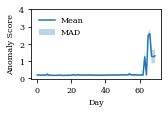

www.ebay.ca


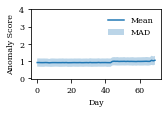

www.youm7.com


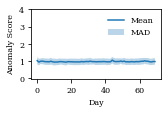

www.amazon.co.jp


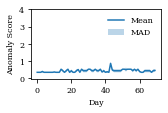

www.google.com.hk


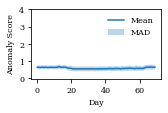

www.espn.com


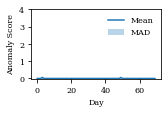

medium.com


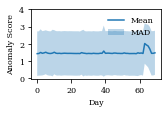

www.vidio.com


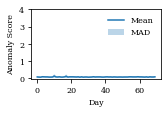

xhamster.com


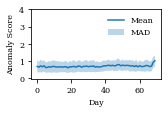

www.worldometers.info


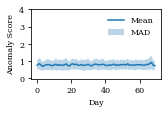

www.grammarly.com


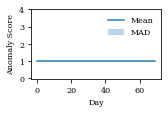

www.tahiamasr.com


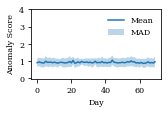

spankbang.com


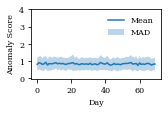

daftsex.com


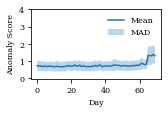

www.uber.com


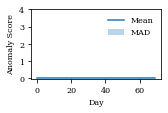

www.elbalad.news


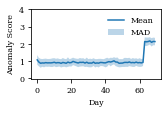

www.ebay-kleinanzeigen.de


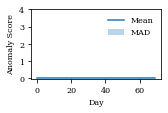

www.flashscore.com


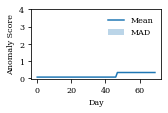

www.healthline.com


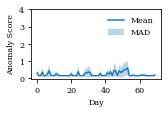

softonic.com


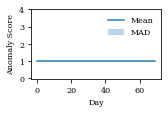

www.amazon.com


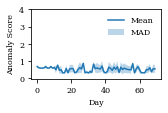

www.instagram.com


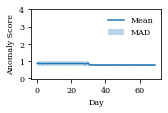

www.bola.net


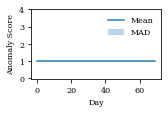

www.nih.gov


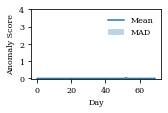

www.google.fr


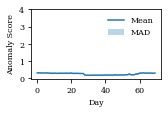

www.ebay.co.uk


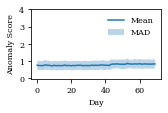

www.google.com.br


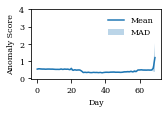

namu.wiki


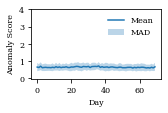

zoom.us


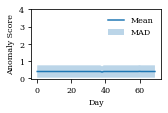

www.shutterstock.com


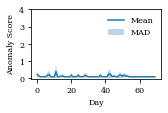

www.google.ru


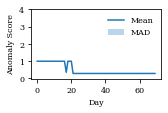

chaturbate.com


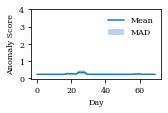

www.kompas.com


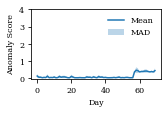

www.trendyol.com


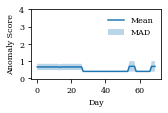

www.google.de


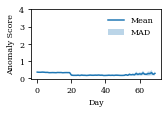

www.metropoles.com


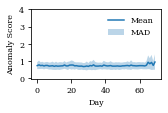

www.amazon.in


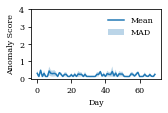

txxx.com


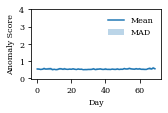

www.primevideo.com


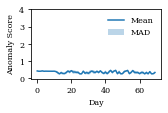

www.google.es


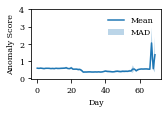

www.cnet.com


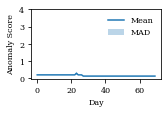

www.theepochtimes.com


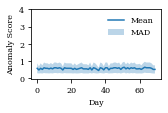

www.ebay.com.au


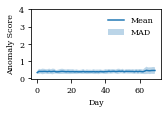

www.inquirer.net


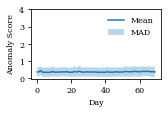

www.imdb.com


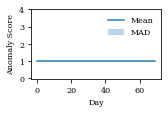

chouftv.ma


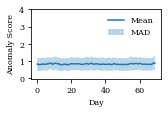

www.okta.com


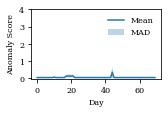

www.brilio.net


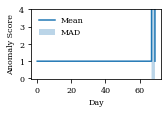

www.ladbible.com


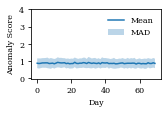

In [2486]:
for f in os.listdir(td_eval):
    if not f.startswith('config-'):
        continue
    with open(os.path.join(td_eval, f), 'r') as fh:
        config_eval = json.load(fh)
    print(config_eval['label'])
    means = np.array([np.mean(np.array(x) / config_eval['max_nll_train']) for x in config_eval['nlls']])
    # upper = [np.percentile(np.array(x) / config_eval['max_nll_train'], 90) for x in config_eval['nlls']]
    # lower = [np.percentile(np.array(x) / config_eval['max_nll_train'], 10) for x in config_eval['nlls']]
    mads = np.array([np.mean(np.abs(np.array(x) / config_eval['max_nll_train'] - means[i])) for i, x in enumerate(config_eval['nlls'])])
    fig, ax = plutils.get_fig(0.66)
    ax.fill_between(np.arange(len(means)), means - mads, means + mads, alpha=0.3, label='MAD')
    ax.plot(means, label='Mean')
    ax.set_xlabel("Day")
    ax.set_ylabel("Anomaly Score")
    ax.legend(frameon=False)
    ax.set_ylim(-0.02, 4)
    ax.set_yticks([0, 1, 2, 3, 4])
    # ax.set_yticklabels([0, 0.5, 1, 1.5])
    fig.subplots_adjust(left=.2, bottom=.275, right=.99, top=.96)
    plt.savefig(f'anomaly-scores/ano-scores-{config_eval["label"]}-days-{slength}.pdf')
    plt.show()

In [2487]:
np.percentile(np.array(config_eval['nlls'][0]) / config_eval['max_nll_train'], 90)

1.2027259672005812

In [868]:
np.array(config_eval['nlls'][0]) / config_eval['max_nll_train']

array([0.14705262, 0.14705262, 0.14705262, 0.14705262, 0.14705262,
       0.14705262, 0.14705262, 0.14705262, 0.14705262, 0.14705262,
       0.14705262, 0.14705262, 0.14705262, 0.14705262, 1.        ,
       1.        , 1.        , 1.        , 1.        , 1.        ])

In [850]:
config_eval

{'uuid_': '2b4b14c3474244788cc75392229dfc3c',
 'accuracy': 1.0,
 'trial_dir': '/opt/project/data/grid-search-results/closed-world-phmm-results-all-data-loaded',
 'classifier': 'phmm',
 'binning_method': 'singlebin',
 'num_bins': 1,
 'day_train_start': 0,
 'day_train_end': 72,
 'seq_length': 5,
 'seq_element_type': 'frame',
 'hmm_length': 30,
 'hmm_duration': 30,
 'knn_num_neighbors': None,
 'seed': 1,
 'hmm_init_prior': 'uniform',
 'hmm_num_iter': 30,
 'ano_density_estimator': None,
 'bin_edges': None,
 'max_bin_size': 1500,
 'label': 'zoom.us',
 'fp': 0,
 'fn': 0,
 'tp': 1438,
 'tn': 74964,
 'knn_fraction': None,
 'sum_log_prob_train': -9311.762800874332,
 'sum_log_prob_val': -2743.4603716483534,
 'avg_log_prob_train': -1.5857906677238305,
 'avg_log_prob_val': -1.9078305783368243,
 'min_nll_train': 0.6966769009343601,
 'min_nll_val': 42.14316880933389,
 'max_nll_train': 4.737602627395483,
 'max_nll_val': 110.91178277141489,
 'nlls': [[0.6966769009343601,
   0.6966769009343601,
   0.69

{'bodies': [<matplotlib.collections.PolyCollection at 0x7fbf9f8dc3a0>],
 'cmaxes': <matplotlib.collections.LineCollection at 0x7fbf9f8dcac0>,
 'cmins': <matplotlib.collections.LineCollection at 0x7fbfc05ebc10>,
 'cbars': <matplotlib.collections.LineCollection at 0x7fbfc05ebe50>}

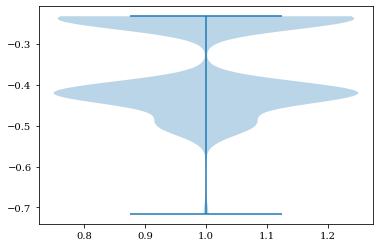

In [837]:
plt.violinplot(np.concatenate(config_eval['nlls']) / -34.74575288039861)

# Plot time series

In [2211]:
with open('/opt/project/data/cache/labels.json', 'r') as fh:
    labels = json.load(fh)
with open('/opt/project/data/cache/meta_data.json', 'r') as fh:
    meta_data = json.load(fh)

In [2228]:
def get_record_sizes(label: str):
    all_sizes = []
    for day, traces in meta_data:
        for meta_record in traces:
            url_id = str(meta_record['url_id'])
            if url_id not in labels:
                continue
            if labels[url_id] != label:
                continue
            if not os.path.exists(f'/opt/project/data/k8s-json/{meta_record["filename"]}.json'):
                continue
            with open(f'/opt/project/data/k8s-json/{meta_record["filename"]}.json', 'r') as fh:
                flow_dict = json.load(fh)
            sizes = []
            for packet in flow_dict['frames'][:30]:
                current_record_id = None
                for record in packet['tls_records']:
                    if record['record_number'] == current_record_id:
                        continue
                    else:
                        current_record_id = record['record_number']
                        sizes.append(record['length'] * record['direction'])
            all_sizes.append(sizes)
    return all_sizes

www.pikiran-rakyat.com 718


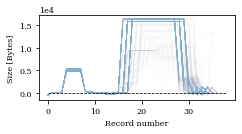

www.sporx.com 3297


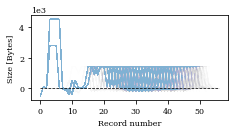

www.facebook.com 3936


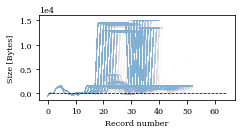

www.youtube.com 4886


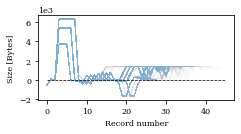

www.cint.com 5152


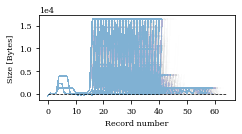

www.y2mate.com 5601


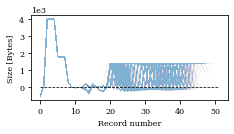

www.mlb.com 6766


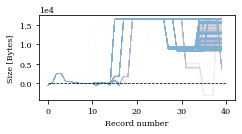

www.ebay.de 7152


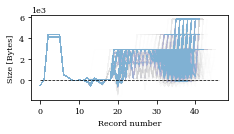

www.zendesk.com 6979


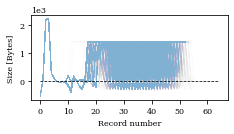

blogger.com 7285


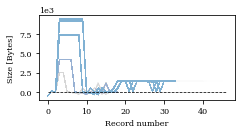

www.bukalapak.com 6904


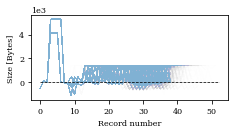

viralporn.com 7325


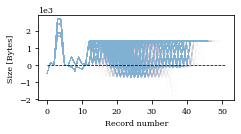

spotify.com 7411


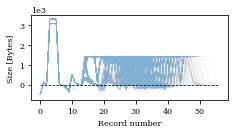

www.ebay.it 7189


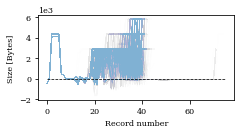

www.amazon.ca 7043


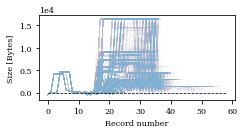

www.sciencedirect.com 7329


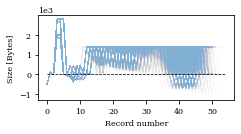

www.shopify.com 7198


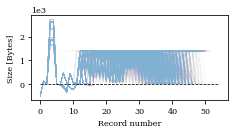

discord.com 7125


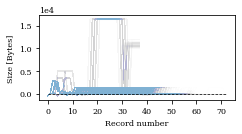

sxyprn.com 7178


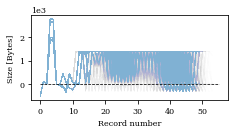

www.tradingview.com 7106


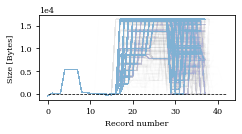

zerodha.com 7066


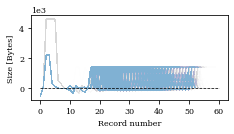

soundcloud.com 7722


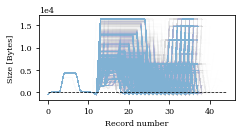

www.ebay.com 6950


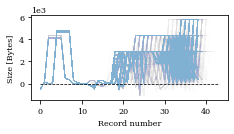

google.com 7136


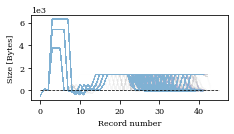

envato.com 7138


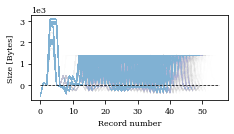

www.amazon.co.uk 7040


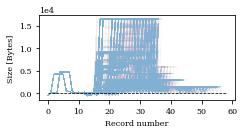

www.ilovepdf.com 7194


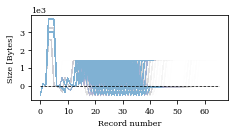

thepiratebay.org 7898


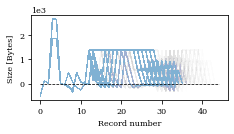

www.google.com 8145


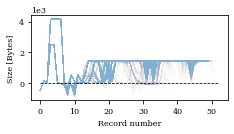

www.netflix.com 8324


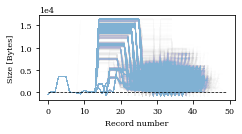

www.google.co.jp 7865


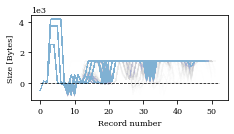

www.setn.com 7028


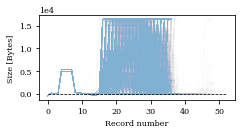

www.amazon.de 6895


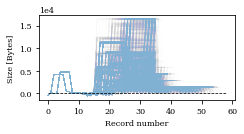

www.ebay.fr 7189


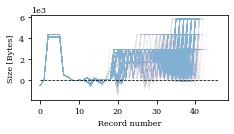

www.jotform.com 7187


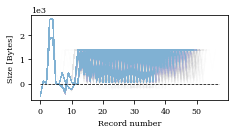

smallpdf.com 7107


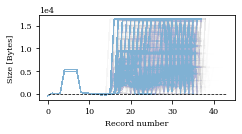

e-hentai.org 7185


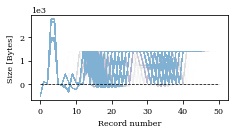

www.jagran.com 7187


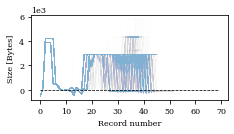

wetransfer.com 7526


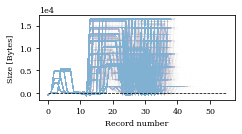

www.mediafire.com 6899


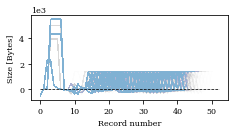

www.google.co.in 8001


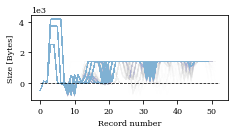

bitly.com 7174


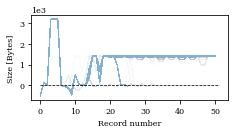

evernote.com 7139


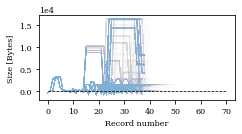

www.udemy.com 7195


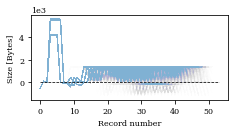

www.instructure.com 7107


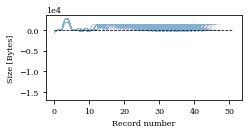

www.merdeka.com 7176


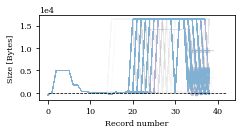

www.grid.id 7108


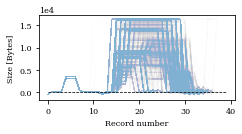

www.mundosexanuncio.com 7167


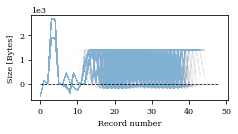

gyazo.com 7131


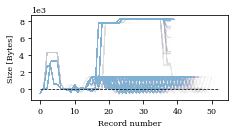

In [2494]:
for lbl in open_world_labels:
    fig, ax = plutils.get_fig(1)
    all_sizes_google_es = get_record_sizes(lbl)
    print(lbl, len(all_sizes_google_es))
    max_len = 0
    for s in all_sizes_google_es:
        ax.plot(s, c=COLORS[1], alpha=0.002)
        max_len = np.max([len(s), max_len])
    ax.set_xlabel("Record number")
    ax.set_ylabel("Size [Bytes]")
    # ax.set_yticks([0, 2000, 4000])
    ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    ax.plot([0, max_len], [0, 0], c='black', linestyle='--', linewidth=0.75)
    fig.subplots_adjust(left=.2, bottom=.33, right=.99, top=.88)
    lbl_t = lbl.replace('.', '-')
    plt.savefig(f'record-size-sequence-{lbl_t}.png', dpi=600)
    plt.show()

www.nih.gov 6938


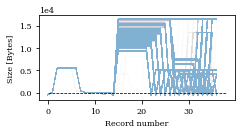

chaturbate.com 7043


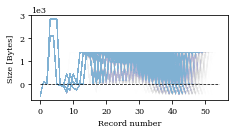

chouftv.ma 7048


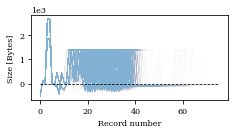

www.shutterstock.com 7076


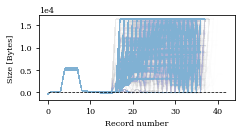

www.tahiamasr.com 7108


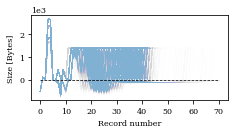

www.grammarly.com 7132


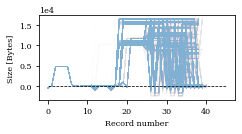

spankbang.com 7140


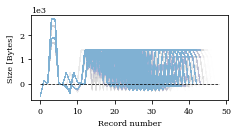

www.brilio.net 7142


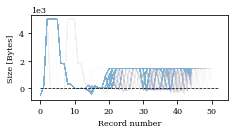

medium.com 7145


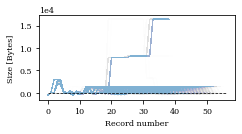

www.youm7.com 7147


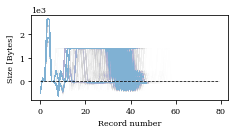

www.healthline.com 7147


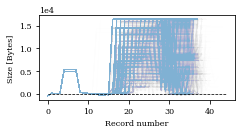

www.elbalad.news 7148


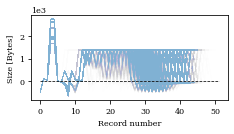

www.cnet.com 7152


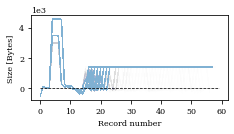

www.imdb.com 7154


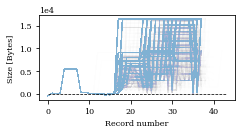

www.ladbible.com 7157


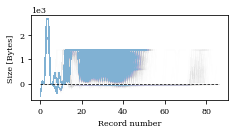

www.ebay-kleinanzeigen.de 7163


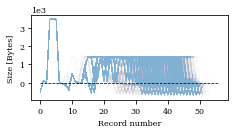

www.bola.net 7166


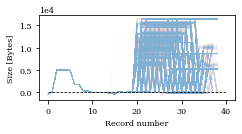

www.amazon.com 7169


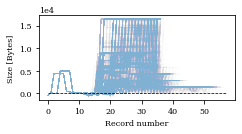

www.worldometers.info 7170


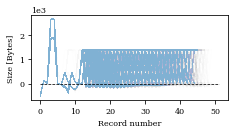

txxx.com 7173


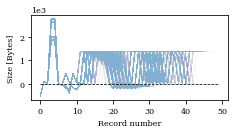

www.amazon.in 7174


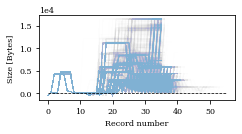

www.amazon.co.jp 7179


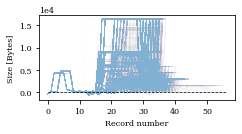

namu.wiki 7180


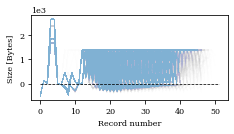

www.vidio.com 7180


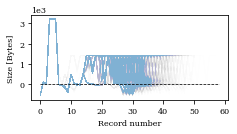

daftsex.com 7183


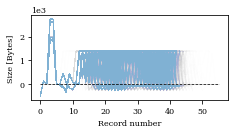

www.okta.com 7183


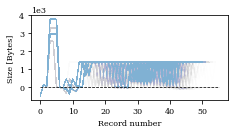

www.kompas.com 7184


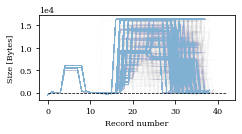

www.flashscore.com 7186


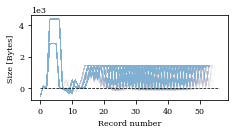

www.espn.com 7187


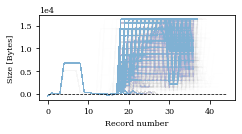

www.theepochtimes.com 7188


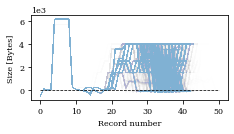

www.trendyol.com 7192


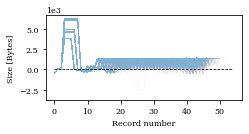

xhamster.com 7193


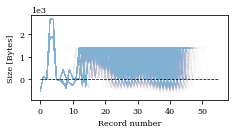

www.ebay.co.uk 7193


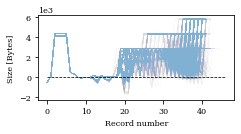

www.ebay.ca 7194


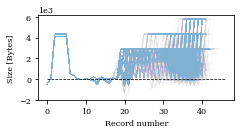

www.uber.com 7312


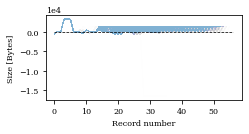

zoom.us 7314


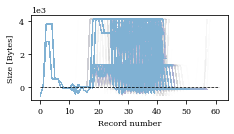

www.ebay.com.au 7329


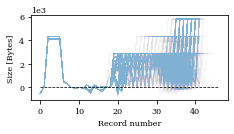

namnak.com 7332


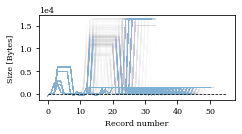

www.instagram.com 7451


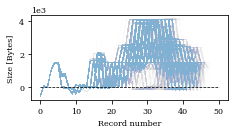

softonic.com 7565


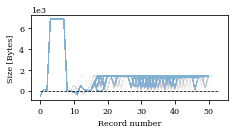

www.metropoles.com 7610


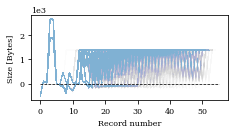

www.inquirer.net 7805


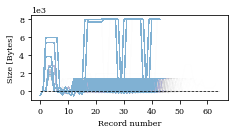

www.google.com.hk 8004


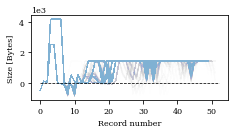

www.google.es 8006


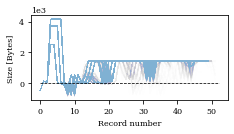

www.google.com.br 8008


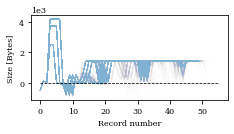

www.google.fr 8009


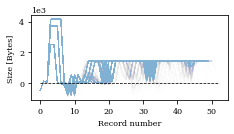

www.google.ru 8009


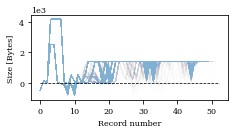

www.google.de 8155


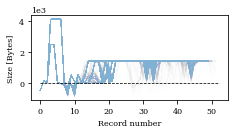

www.primevideo.com 8478


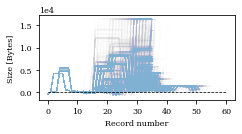

In [2493]:
for lbl in closed_world_labels:
    fig, ax = plutils.get_fig(1)
    all_sizes_google_es = get_record_sizes(lbl)
    print(lbl, len(all_sizes_google_es))
    max_len = 0
    for s in all_sizes_google_es:
        ax.plot(s, c=COLORS[1], alpha=0.002)
        max_len = np.max([len(s), max_len])
    ax.set_xlabel("Record number")
    ax.set_ylabel("Size [Bytes]")
    # ax.set_yticks([0, 2000, 4000])
    ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    ax.plot([0, max_len], [0, 0], c='black', linestyle='--', linewidth=0.75)
    fig.subplots_adjust(left=.2, bottom=.33, right=.99, top=.88)
    lbl_t = lbl.replace('.', '-')
    plt.savefig(f'record-size-sequence-{lbl_t}.png', dpi=600)
    plt.show()

In [2230]:
all_sizes_google_es = get_record_sizes('www.google.es')
all_sizes_prime_com = get_record_sizes('www.primevideo.com')

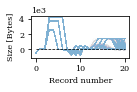

In [2305]:
fig, ax = plutils.get_fig(0.5)
for s in all_sizes_google_es:
    ax.plot(s[:21], c=COLORS[1], alpha=0.002)
ax.set_xlabel("Record number")
ax.set_ylabel("Size [Bytes]")
ax.set_yticks([0, 2000, 4000])
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax.plot([0, 20], [0, 0], c='black', linestyle='--', linewidth=0.75)
fig.subplots_adjust(left=.2, bottom=.33, right=.99, top=.88)
plt.savefig('record-size-sequence-google.png', dpi=300)

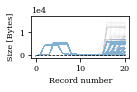

In [2302]:
fig, ax = plutils.get_fig(0.5)
for s in all_sizes_prime_com:
    ax.plot(s[:21], c=COLORS[1], alpha=0.002)
ax.set_xlabel("Record number")
ax.set_ylabel("Size [Bytes]")
ax.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
fig.subplots_adjust(left=.2, bottom=.33, right=.99, top=.88)
ax.plot([0, 20], [0, 0], c='black', linestyle='--', linewidth=0.75)
plt.savefig('record-size-sequence-primevideo.png', dpi=300)

# Analyze run-times